<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Chocolate%20Sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chocolate Sales in (2022–2023)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d arjunmehta1992/chocolate-sales-in-20222023

# Unziping the downloaded file
!unzip chocolate-sales-in-20222023.zip

Saving kaggle.json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/arjunmehta1992/chocolate-sales-in-20222023
License(s): CC0-1.0
chocolate-sales-in-20222023.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  chocolate-sales-in-20222023.zip
replace Chocolate_Sales.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Chocolate_Sales.csv     


In [3]:
df = pd.read_csv('Chocolate_Sales.csv')
df.head(11)

,Order_ID,Product,Country,Channel,Salesperson,Order_Date,Discount_Pct,Price_per_Box,Marketing_Spend,Boxes_Shipped,Amount
0,ORD-069833,Truffle Gift Box,Australia,Retail,Arjun Mehta,2022-12-11,3.5,13.72,202.03,71,912.31
1,ORD-090726,85% Dark Bar,Australia,Retail,Arjun Mehta,2023-03-14,9.4,3.30,55.18,84,245.91
2,ORD-042159,70% Dark Bar,Japan,Retail,Hannah Müller,2023-12-21,4.9,18.21,60.65,35,583.7
3,ORD-197166,Hazelnut Milk Bar,Germany,Retail,Arjun Mehta,2023-12-18,15.0,2.66,52.00,92,211.27
4,ORD-112162,Almond Crunch Bar,Australia,Retail,Yuki Sato,2023-08-18,4.4,2.75,187.44,214,549.69
5,ORD-051262,70% Dark Bar,Brazil,Online,Lucas Walker,2023-08-04,17.8,12.87,76.94,47,527.01
6,ORD-041587,Hazelnut Milk Bar,Australia,Wholesale,Ananya Gupta,2023-02-20,12.0,3.18,241.18,159,470.63
7,ORD-017541,Mixed Assortment Box,Australia,Online,Lucas Walker,2022-04-01,22.6,2.43,94.27,326,629.51
8,ORD-134320,85% Dark Bar,Germany,Retail,Rohan Patel,2022-08-26,13.9,2.98,68.88,70,181.16
9,ORD-068442,Truffle Gift Box,Germany,Retail,Priya Sharma,2022-01-01,16.3,3.13,102.50,213,588.18


In [4]:
df.tail(11)

,Order_ID,Product,Country,Channel,Salesperson,Order_Date,Discount_Pct,Price_per_Box,Marketing_Spend,Boxes_Shipped,Amount
199989,ORD-068120,Truffle Gift Box,Brazil,Wholesale,Priya Sharma,2022-02-25,6.10,3.19,108.42,308,841.67
199990,ORD-187791,Hazelnut Milk Bar,Australia,Online,Emily Clarke,2022-05-10,13.50,3.25,124.92,107,308.26
199991,ORD-126138,Mint Dark Bar,India,Wholesale,Arjun Mehta,2022-09-15,13.10,17.42,63.02,22,305.44
199992,ORD-099677,Mint Dark Bar,India,Online,Rafael Oliveira,2022-01-24,20.28,3.19,45.05,54,150.07
199993,ORD-079464,Pralines Gift Box,Australia,Retail,Rohan Patel,2022-07-04,3.00,3.30,69.73,58,180.31
199994,ORD-066456,70% Dark Bar,Australia,Wholesale,Emily Clarke,2023-02-01,22.50,2.84,201.48,237,550.57
199995,ORD-053460,70% Dark Bar,Australia,Retail,Beatriz Souza,2022-05-27,10.60,3.39,186.19,125,418.56
199996,ORD-010743,Truffle Gift Box,India,Wholesale,Arjun Mehta,2022-09-06,17.30,3.07,42.28,148,366.47
199997,ORD-049690,Salted Caramel Bar,Japan,Online,Arjun Mehta,2022-06-16,18.30,2.74,100.19,149,329.79
199998,ORD-189637,85% Dark Bar,Japan,Wholesale,Rohan Patel,2022-10-14,9.30,14.30,29.96,24,304.51


In [5]:
df.shape

(200000, 11)

In [6]:
df.columns

Index(['Order_ID', 'Product', 'Country', 'Channel', 'Salesperson',
       'Order_Date', 'Discount_Pct', 'Price_per_Box', 'Marketing_Spend',
       'Boxes_Shipped', 'Amount'],
      dtype='object')

In [7]:
df.dtypes

,0
Order_ID,object
Product,object
Country,object
Channel,object
Salesperson,object
Order_Date,object
Discount_Pct,float64
Price_per_Box,float64
Marketing_Spend,float64
Boxes_Shipped,int64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Order_ID         200000 non-null  object 
 1   Product          200000 non-null  object 
 2   Country          200000 non-null  object 
 3   Channel          200000 non-null  object 
 4   Salesperson      200000 non-null  object 
 5   Order_Date       199563 non-null  object 
 6   Discount_Pct     199511 non-null  float64
 7   Price_per_Box    199543 non-null  float64
 8   Marketing_Spend  199539 non-null  float64
 9   Boxes_Shipped    200000 non-null  int64  
 10  Amount           200000 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 16.8+ MB


In [10]:
df.duplicated().sum()

np.int64(0)

## Fixing Missing Values and Data Types

In [11]:
print(df.isnull().sum())

Order_ID             0
Product              0
Country              0
Channel              0
Salesperson          0
Order_Date         437
Discount_Pct       489
Price_per_Box      457
Marketing_Spend    461
Boxes_Shipped        0
Amount               0
dtype: int64


In [6]:
# Pre-cleaning 'Amount' to remove non-numeric characters (like '$')
# This step is crucial if the original data had currency symbols that weren't handled
if df['Amount'].dtype == 'object': # Only apply if 'Amount' is still an object type
    df['Amount'] = df['Amount'].astype(str).str.replace('[^0-9.-]', '', regex=True)

# Converting 'Amount' to numeric, coercing errors to NaN
df['Amount'] = pd.to_numeric(df['Amount'], errors='coerce')

# Imputing missing numerical values with the median
df['Discount_Pct'].fillna(df['Discount_Pct'].median(), inplace=True)
df['Price_per_Box'].fillna(df['Price_per_Box'].median(), inplace=True)
df['Marketing_Spend'].fillna(df['Marketing_Spend'].median(), inplace=True)
df['Amount'].fillna(df['Amount'].median(), inplace=True)

# Converting 'Order_Date' to datetime
df['Order_Date'] = pd.to_datetime(df['Order_Date'], errors='coerce')

# Imputing missing 'Order_Date' values with the mode
# We are checking for NaT (Not a Time) values after conversion.
if df['Order_Date'].isnull().any():
    mode_date = df['Order_Date'].mode()[0]
    df['Order_Date'].fillna(mode_date, inplace=True)

# Verifying that there are no more missing values
print('\nMissing values after imputation:')
print(df.isnull().sum())

# Display info to confirm data types and non-null counts
print('\nDataFrame Info after cleaning:')
df.info()


Missing values after imputation:
Order_ID           0
Product            0
Country            0
Channel            0
Salesperson        0
Order_Date         0
Discount_Pct       0
Price_per_Box      0
Marketing_Spend    0
Boxes_Shipped      0
Amount             0
dtype: int64

DataFrame Info after cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   Order_ID         200000 non-null  object        
 1   Product          200000 non-null  object        
 2   Country          200000 non-null  object        
 3   Channel          200000 non-null  object        
 4   Salesperson      200000 non-null  object        
 5   Order_Date       200000 non-null  datetime64[ns]
 6   Discount_Pct     200000 non-null  float64       
 7   Price_per_Box    200000 non-null  float64       
 8   Marketing_Spend  200000 non-null  

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Order_ID,200000,200000,ORD-132165,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product,200000,12,70% Dark Bar,64800,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Country,200000,5,Australia,92594,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Channel,200000,3,Retail,116505,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Salesperson,200000,25,Arjun Mehta,67589,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Order_Date,199563,2000,2023-08-13,317,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Discount_Pct,199511.0,NaN,NaN,NaN,13.107457,6.374477,0.0,8.3,12.6,17.5,38.3
Price_per_Box,199543.0,NaN,NaN,NaN,5.911507,4.954976,2.04,2.95,3.28,4.57,21.65
Marketing_Spend,199539.0,NaN,NaN,NaN,95.450141,66.24376,4.3,52.27,78.85,118.71,798.222443
Boxes_Shipped,200000.0,NaN,NaN,NaN,139.584105,118.665393,-1642.0,67.0,113.0,180.0,3811.0


# Univariate Analysis

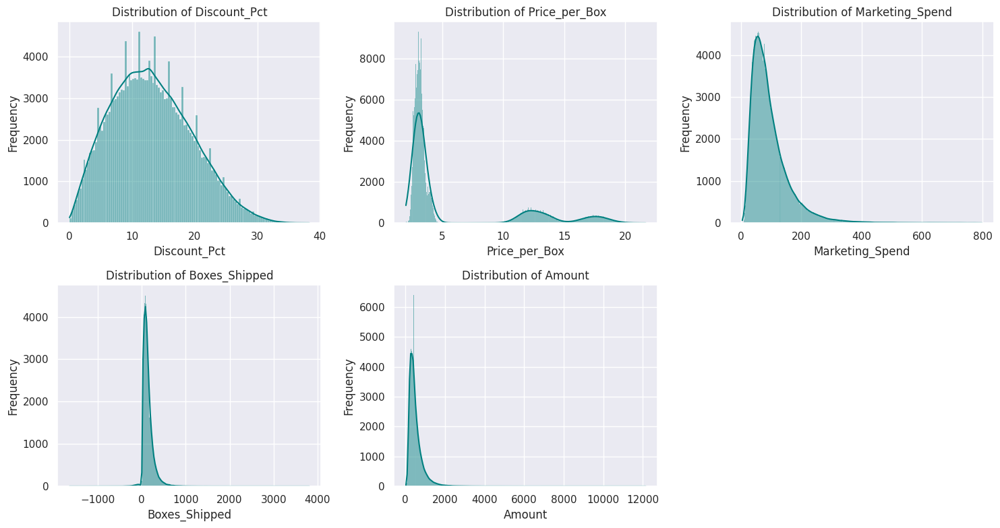

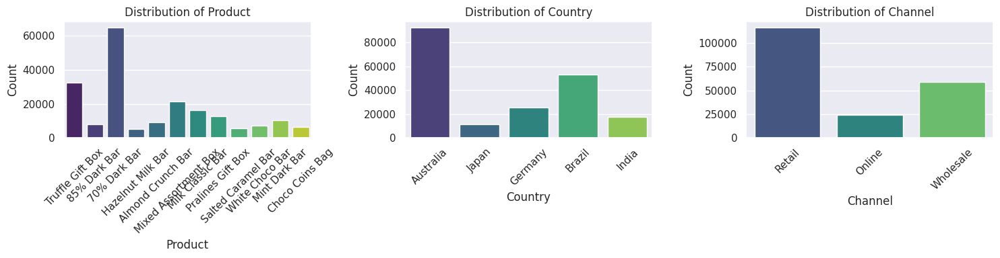

--- Categorical Value Counts ---

Value counts for Product:
Product
70% Dark Bar            64800
Truffle Gift Box        32295
Mixed Assortment Box    21469
Milk Classic Bar        16176
Pralines Gift Box       12734
Mint Dark Bar           10582
Almond Crunch Bar        9199
85% Dark Bar             8002
White Choco Bar          7148
Choco Coins Bag          6470
Salted Caramel Bar       5802
Hazelnut Milk Bar        5323
Name: count, dtype: int64

Value counts for Country:
Country
Australia    92594
Brazil       52960
Germany      25269
India        17514
Japan        11663
Name: count, dtype: int64

Value counts for Channel:
Channel
Retail       116505
Wholesale     59244
Online        24251
Name: count, dtype: int64


In [14]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

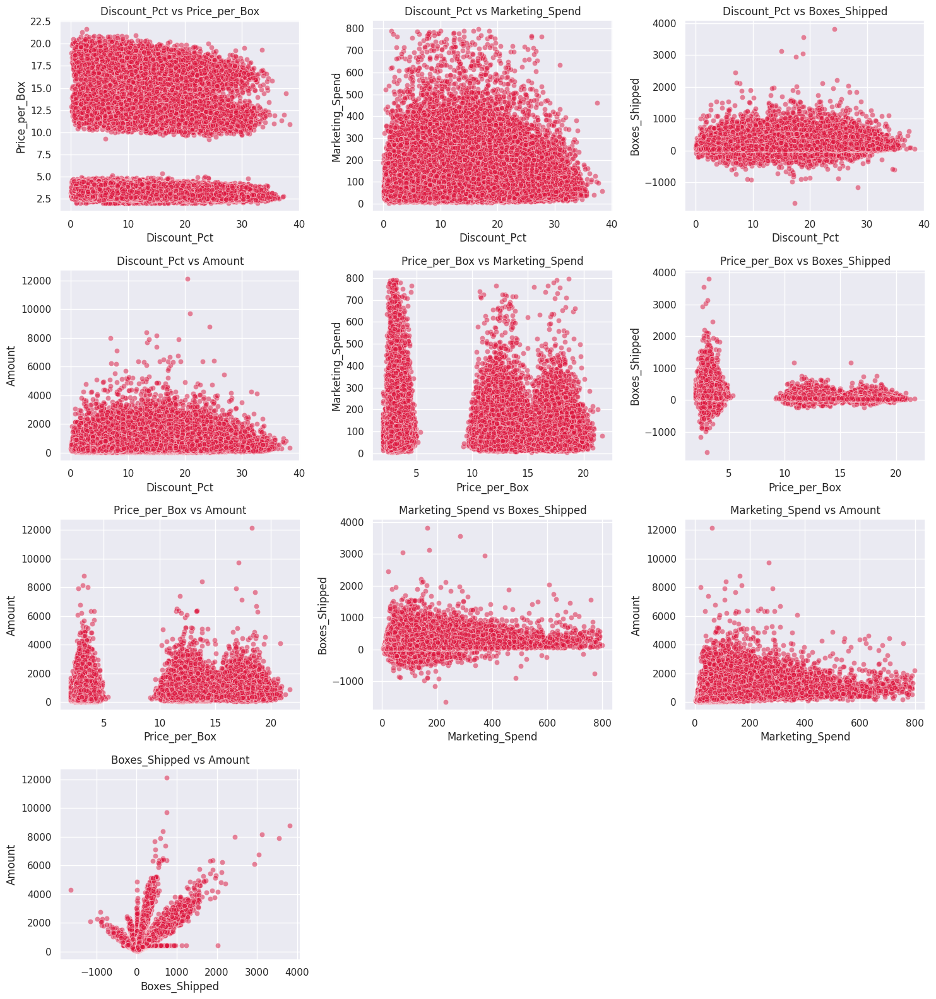

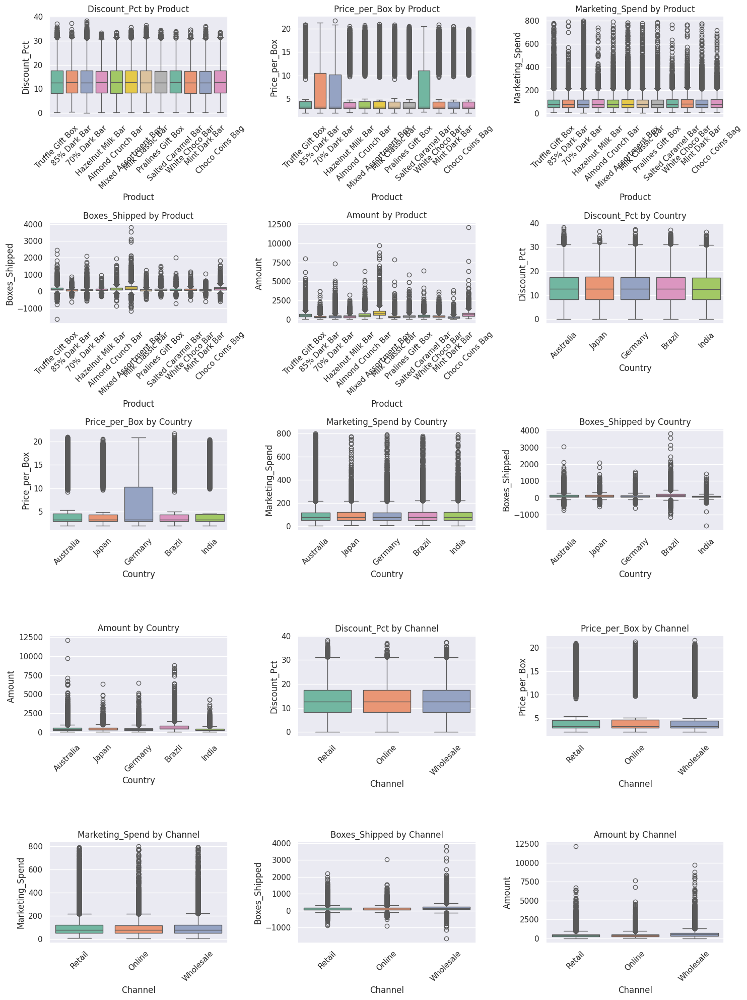

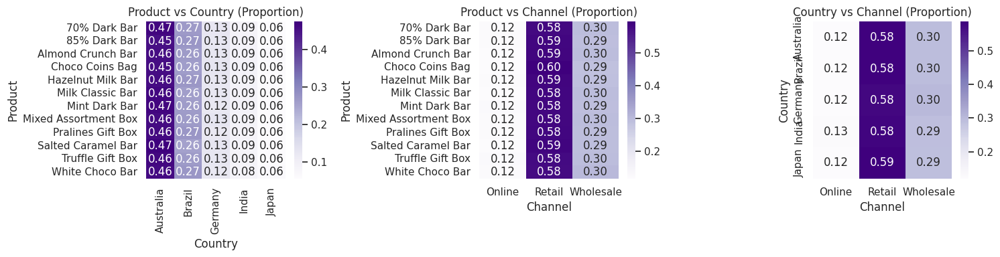

In [15]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Ensure axes is always a 1D array of Axes objects
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson')
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Ensure axes is always a 1D array of Axes objects
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Ensure axes is always a 1D array of Axes objects
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Multivariate Analysis


Analyzing relationships with Hue: Product...


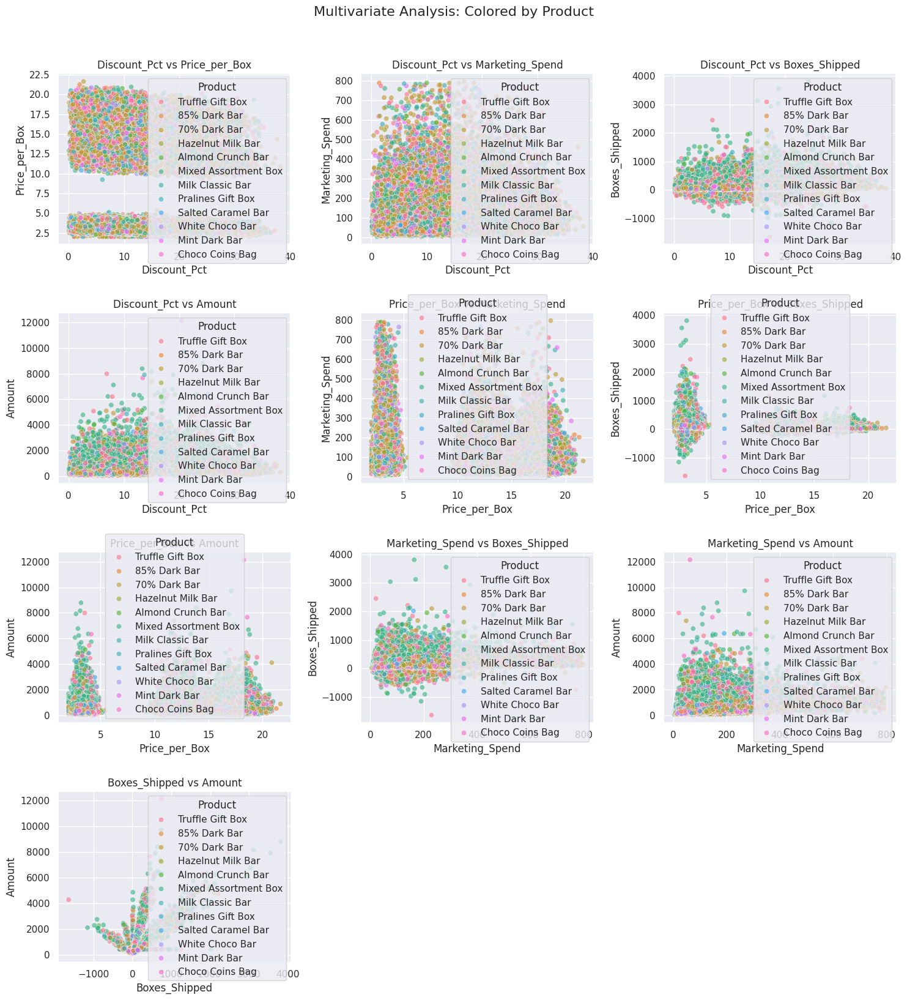


Analyzing relationships with Hue: Country...


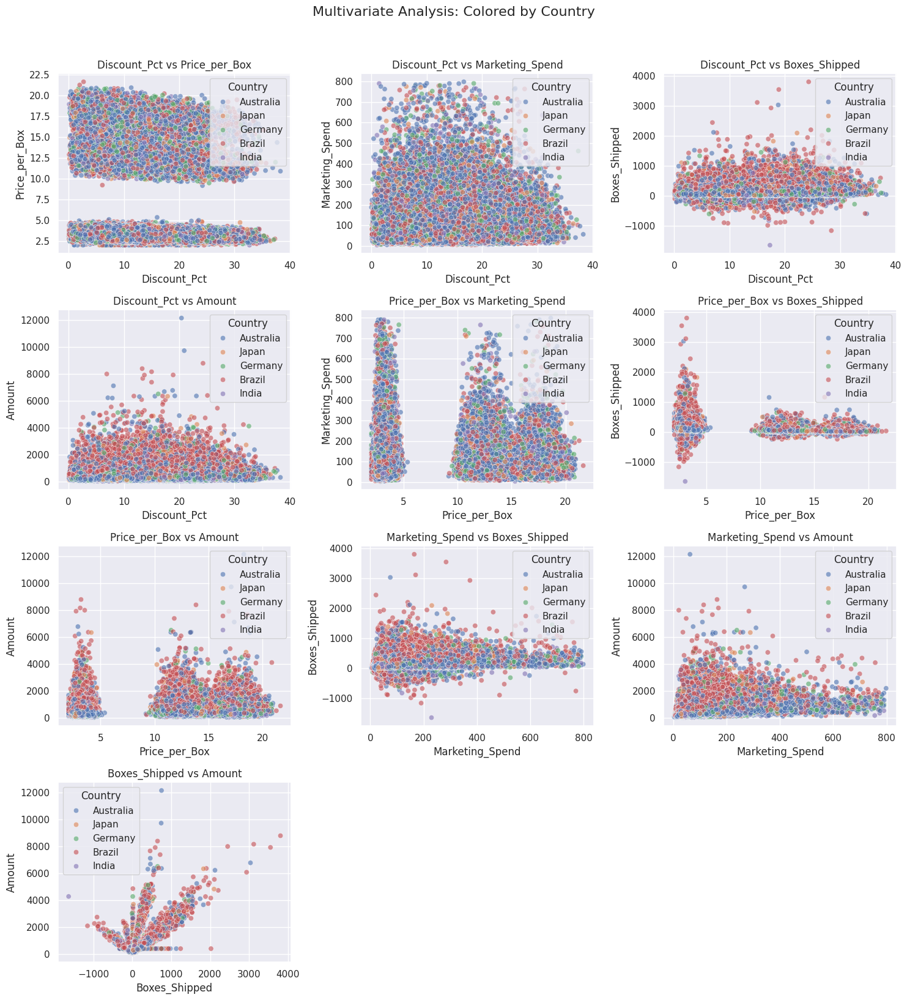


Analyzing relationships with Hue: Channel...


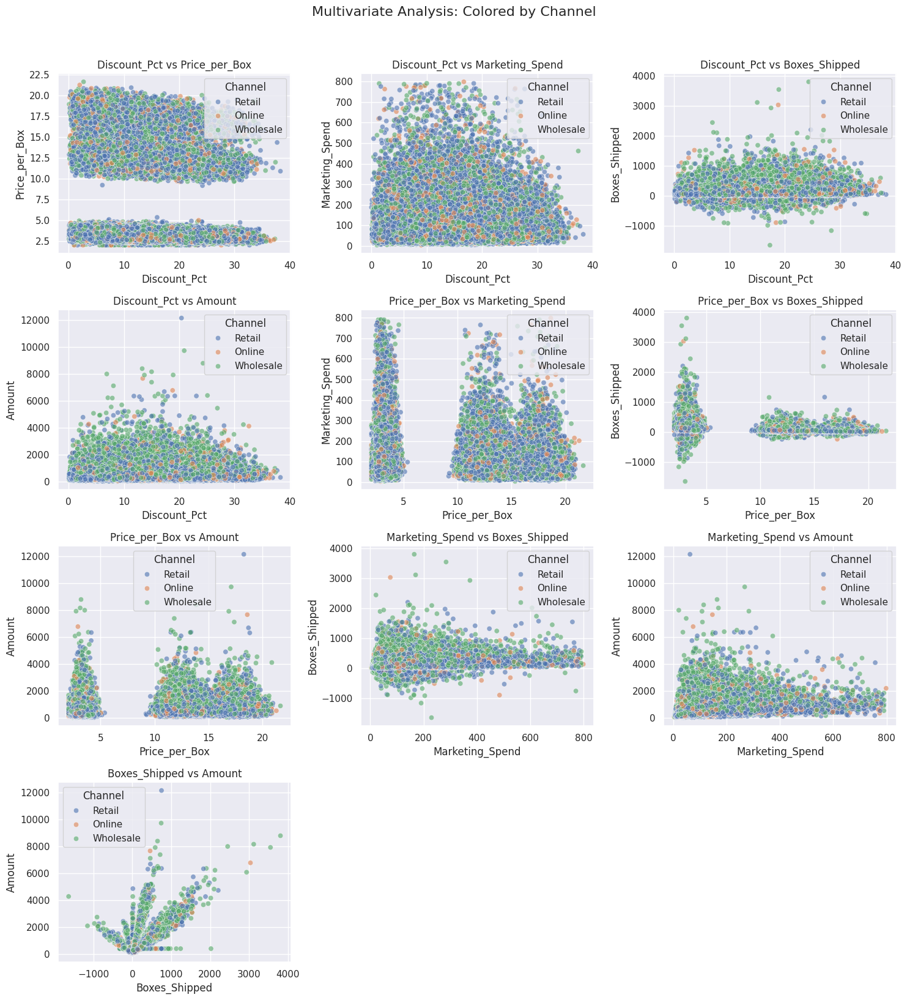

In [16]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 20)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure and axes
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))

        # Ensuring axes is always a 1D array of Axes objects
        if not isinstance(axes, np.ndarray):
            axes = np.array([axes])
        else:
            axes = axes.flatten()

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pair-Plot

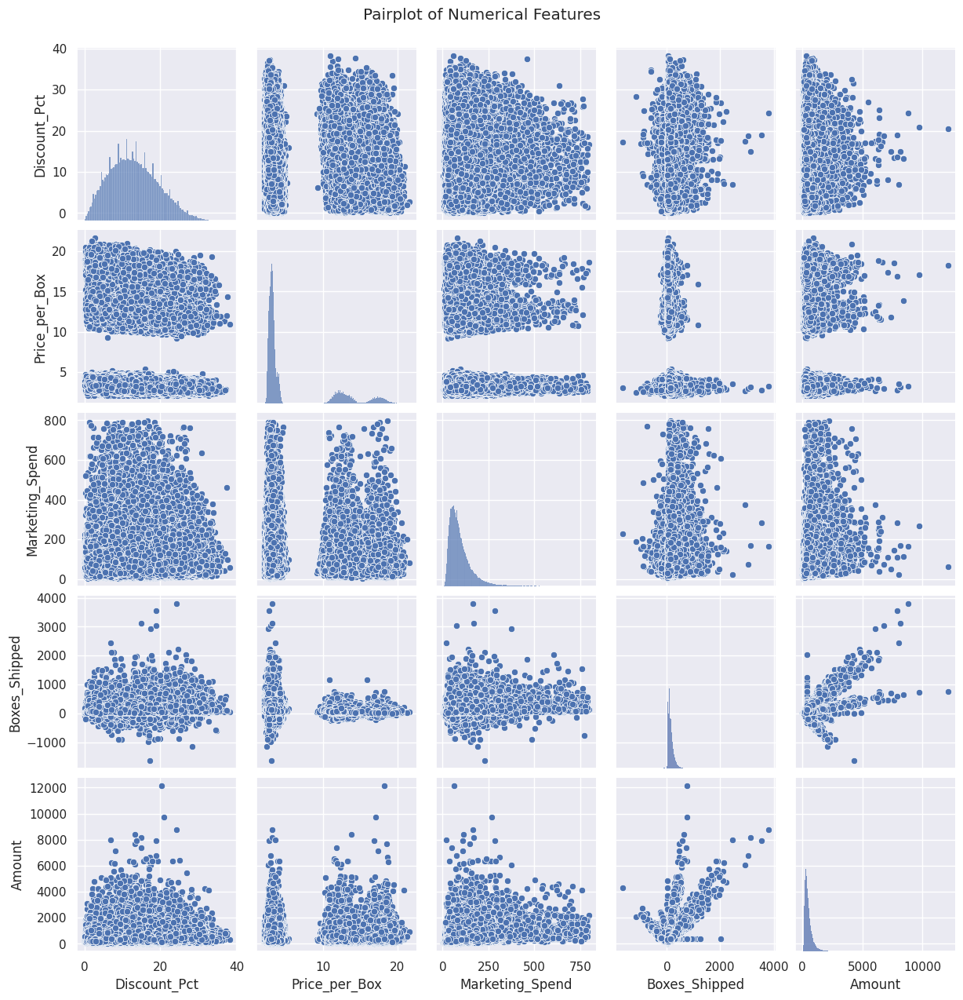

In [17]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# HeatMap

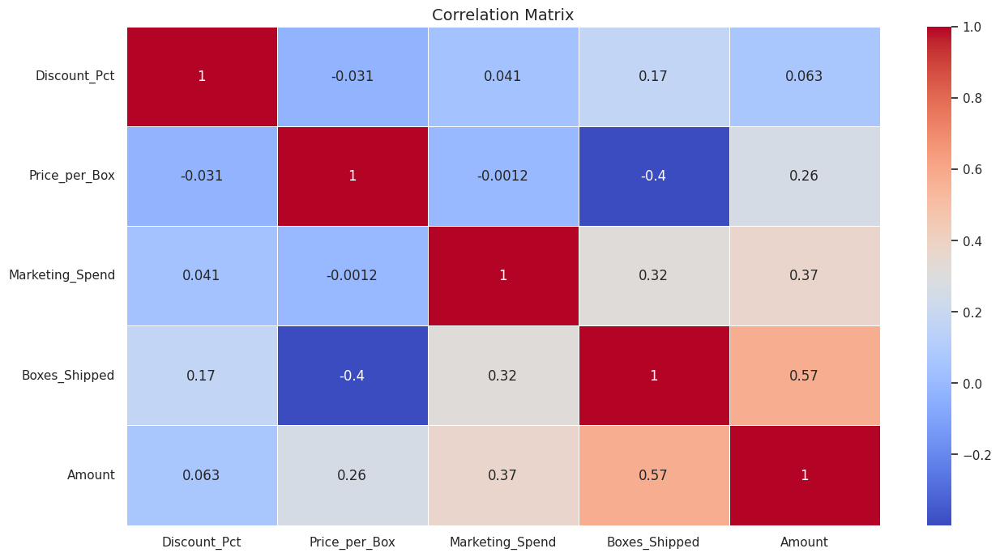

In [18]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

── Extended Descriptive Statistics ──
                    count      mean      std      min      25%       50%       75%        max    median  skewness  kurtosis   cv%
Discount_Pct     200000.0    13.106    6.367     0.00     8.30    12.600    17.500     38.300    12.600     0.352    -0.385  48.6
Price_per_Box    200000.0     5.905    4.951     2.04     2.95     3.280     4.490     21.650     3.280     1.383     0.311  83.8
Marketing_Spend  200000.0    95.412   66.172     4.30    52.33    78.850   118.592    798.222    78.850     2.634    12.987  69.4
Boxes_Shipped    200000.0   139.584  118.665 -1642.00    67.00   113.000   180.000   3811.000   113.000     2.991    31.766  85.0
Amount           200000.0   512.862  365.477    28.81   287.38   417.295   622.520  12138.090   417.295     3.759    35.930  71.3
Year             200000.0  2022.506    0.500  2022.00  2022.00  2023.000  2023.000   2023.000  2023.000    -0.025    -1.999   0.0
Month            200000.0     6.543    3.428     1.0

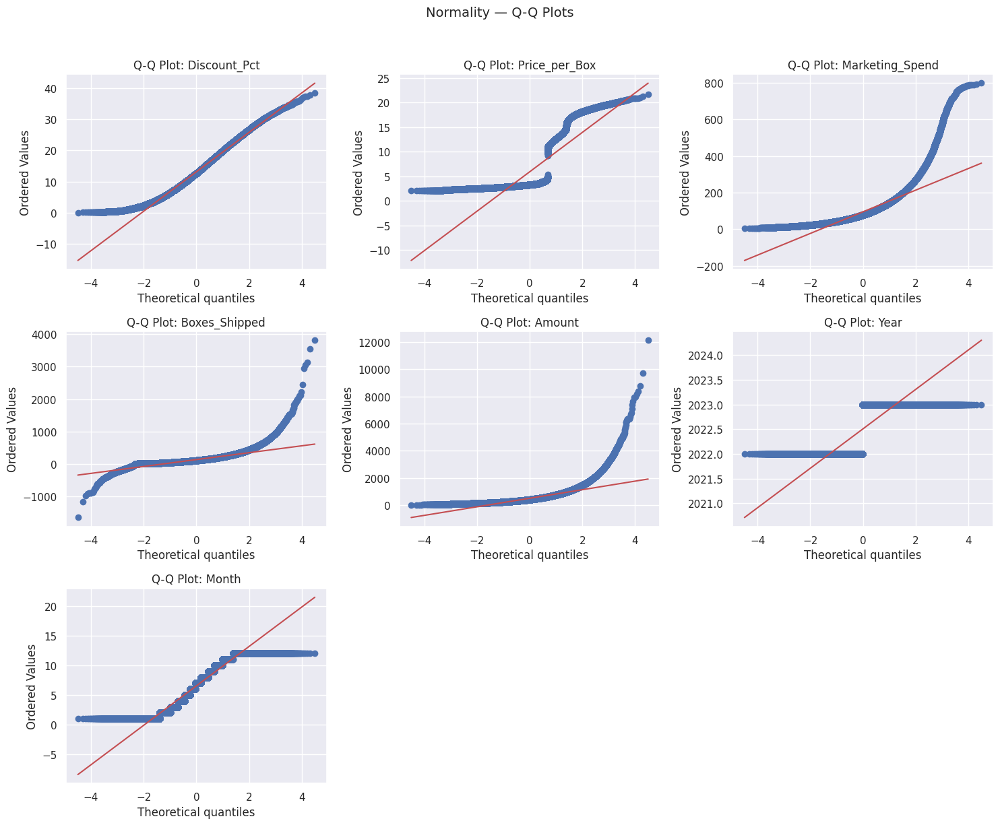

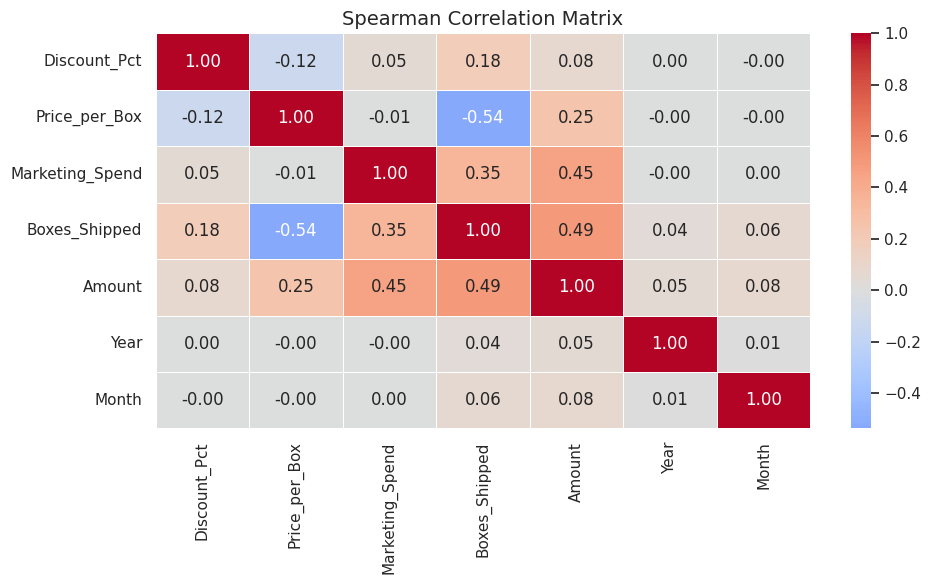


── ANOVA: Categorical Columns vs Amount ──

  Product
    ANOVA          F=4959.880,  p=0.000000  ✓ Significant
    Kruskal-Wallis H=50231.188,  p=0.000000
    Tukey HSD (top pairs):
                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
       group1               group2         meandiff p-adj    lower     upper   reject
-------------------------------------------------------------------------------------
        70% Dark Bar         85% Dark Bar   -35.868    0.0  -48.4126  -23.3233   True
        70% Dark Bar    Almond Crunch Bar  223.0121    0.0  211.2163  234.8079   True
        70% Dark Bar      Choco Coins Bag   332.186    0.0  318.3826  345.9894   True
        70% Dark Bar    Hazelnut Milk Bar    0.0134    1.0  -15.0817   15.1086  False
        70% Dark Bar     Milk Classic Bar  -20.4865    0.0  -29.7918  -11.1813   True
        70% Dark Bar        Mint Dark Bar  -74.8516    0.0  -85.9519  -63.7513   True
        70% Dark Bar Mixed Assortment Box 

In [8]:
# ================================================================
# STATISTICAL ANALYSIS  (paste after your existing Heatmap cell)
# ================================================================
from scipy import stats
from scipy.stats import shapiro, normaltest, ttest_ind, mannwhitneyu, f_oneway, kruskal, chi2_contingency
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import warnings
warnings.filterwarnings('ignore')

numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

# ── 1. Extended Descriptive Stats ───────────────────────────────
desc = df[numerical_cols].describe().T
desc['median']   = df[numerical_cols].median()
desc['skewness'] = df[numerical_cols].skew()
desc['kurtosis'] = df[numerical_cols].kurtosis()
desc['cv%']      = (df[numerical_cols].std() / df[numerical_cols].mean() * 100).round(1)
print("── Extended Descriptive Statistics ──")
print(desc.round(3).to_string())

# ── 2. Normality Tests ──────────────────────────────────────────
print("\n── Normality Tests ──")
for col in numerical_cols:
    sample = df[col].dropna().sample(min(len(df), 5000), random_state=42)
    sw_stat, sw_p = shapiro(sample)
    dp_stat, dp_p = normaltest(df[col].dropna())
    print(f"  {col:20s}  Shapiro p={sw_p:.4f}  D'Agostino p={dp_p:.4f}  → {'Normal ✓' if sw_p > 0.05 else 'Non-normal ✗'}")

# ── 3. Outlier Detection ────────────────────────────────────────
print("\n── Outlier Detection ──")
for col in numerical_cols:
    Q1, Q3 = df[col].quantile(0.25), df[col].quantile(0.75)
    IQR = Q3 - Q1
    n_iqr = ((df[col] < Q1 - 1.5*IQR) | (df[col] > Q3 + 1.5*IQR)).sum()
    n_z   = (np.abs(stats.zscore(df[col].dropna())) > 3).sum()
    print(f"  {col:20s}  IQR outliers: {n_iqr}   Z-score outliers: {n_z}")

# ── 4. Q-Q Plots ────────────────────────────────────────────────
import math
num_cols_plot = 3
num_rows_plot = math.ceil(len(numerical_cols) / num_cols_plot)
fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(5 * num_cols_plot, 4 * num_rows_plot))
axes = axes.flatten()
for i, col in enumerate(numerical_cols):
    stats.probplot(df[col].dropna(), dist='norm', plot=axes[i])
    axes[i].set_title(f'Q-Q Plot: {col}')
for j in range(i + 1, len(axes)):
    axes[j].axis('off')
plt.suptitle('Normality — Q-Q Plots', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

# ── 5. Spearman Correlation ─────────────────────────────────────
plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_cols].corr(method='spearman'), annot=True, fmt='.2f',
            cmap='coolwarm', center=0, linewidths=0.4)
plt.title('Spearman Correlation Matrix', fontsize=14)
plt.tight_layout()
plt.show()

# ── 6. ANOVA: each categorical vs Amount ────────────────────────
print("\n── ANOVA: Categorical Columns vs Amount ──")
for cat in categorical_cols:
    # Ensure 'Amount' is numeric within each group before statistical tests
    # Explicitly cast to float to prevent TypeError if pandas/numpy interpret types unexpectedly
    groups = [g['Amount'].dropna().astype(float) for _, g in df.groupby(cat)]
    # Filter out groups with insufficient data for comparison (ANOVA needs at least 2 observations per group)
    groups = [g for g in groups if len(g) > 1]

    if len(groups) >= 2: # f_oneway and Kruskal-Wallis require at least two groups
        f, p   = f_oneway(*groups)
        h, p_k = kruskal(*groups)
        print(f"\n  {cat}")
        print(f"    ANOVA          F={f:.3f},  p={p:.6f}  {'✓ Significant' if p < 0.05 else '✗ Not significant'}")
        print(f"    Kruskal-Wallis H={h:.3f},  p={p_k:.6f}")

        if p < 0.05: # Only perform Tukey HSD if ANOVA is significant
            # Prepare data for Tukey HSD, ensuring 'Amount' is float and groups are aligned
            tukey_data_series = df['Amount'].dropna().astype(float)
            tukey_groups_series = df.loc[tukey_data_series.index, cat]

            # Get the list of categories that have at least 2 data points for the current 'cat'
            valid_categories_for_tukey = [name for name, group in df.groupby(cat)
                                          if len(group['Amount'].dropna().astype(float)) > 1]

            if len(valid_categories_for_tukey) >= 2: # Tukey needs at least two valid groups
                # Filter the Tukey data and groups to include only the valid categories
                filtered_tukey_data = tukey_data_series[tukey_groups_series.isin(valid_categories_for_tukey)]
                filtered_tukey_groups = tukey_groups_series[tukey_groups_series.isin(valid_categories_for_tukey)]

                if len(filtered_tukey_data) > 0 and len(filtered_tukey_groups.unique()) >= 2:
                    try:
                        tukey = pairwise_tukeyhsd(filtered_tukey_data, filtered_tukey_groups, alpha=0.05)
                        print(f"    Tukey HSD (top pairs):")
                        print(tukey.summary())
                    except ValueError as e:
                        print(f"    Could not perform Tukey HSD for {cat}: {e}")
                else:
                    print(f"    Not enough valid data points or unique groups for Tukey HSD for {cat}.")
            else:
                print(f"    Not enough valid groups for Tukey HSD for {cat}.")
    else:
        print(f"\n  {cat}: Not enough groups with sufficient data for ANOVA/Kruskal-Wallis.")

# ── 7. Chi-Square between categorical pairs ─────────────────────
import itertools
print("\n── Chi-Square Tests (Categorical Pairs) ──")
for c1, c2 in itertools.combinations(categorical_cols, 2):
    ct = pd.crosstab(df[c1], df[c2])
    # Ensure ct is not empty before calculating chi2
    if not ct.empty and (ct.sum(axis=1) > 0).all() and (ct.sum(axis=0) > 0).all():
        chi2, p_chi, dof, _ = chi2_contingency(ct)
        # Calculate Cramer's V only if min(ct.shape) - 1 is not zero to avoid division by zero
        if min(ct.shape) > 1:
            cramers_v = np.sqrt(chi2 / (len(df) * (min(ct.shape) - 1)))
            print(f"  {c1} × {c2}: χ²={chi2:.2f}, p={p_chi:.4f}, Cramér's V={cramers_v:.3f}")
        else:
            print(f"  {c1} × {c2}: χ²={chi2:.2f}, p={p_chi:.4f} (Cramér's V not applicable)")
    else:
        print(f"  {c1} × {c2}: Cross-tabulation is empty or has zero marginals, skipping Chi-Square.")

# Advanced Statistical Analysis


── Linear Regression: Predictors → Amount ──
  Discount_Pct          slope=3.6759  R²=0.0041  p=0.000000
  Price_per_Box         slope=19.2238  R²=0.0678  p=0.000000
  Marketing_Spend       slope=2.0537  R²=0.1383  p=0.000000
  Boxes_Shipped         slope=1.7865  R²=0.3365  p=0.000000
  Year                  slope=27.2889  R²=0.0014  p=0.000000
  Month                 slope=7.5094  R²=0.0050  p=0.000000


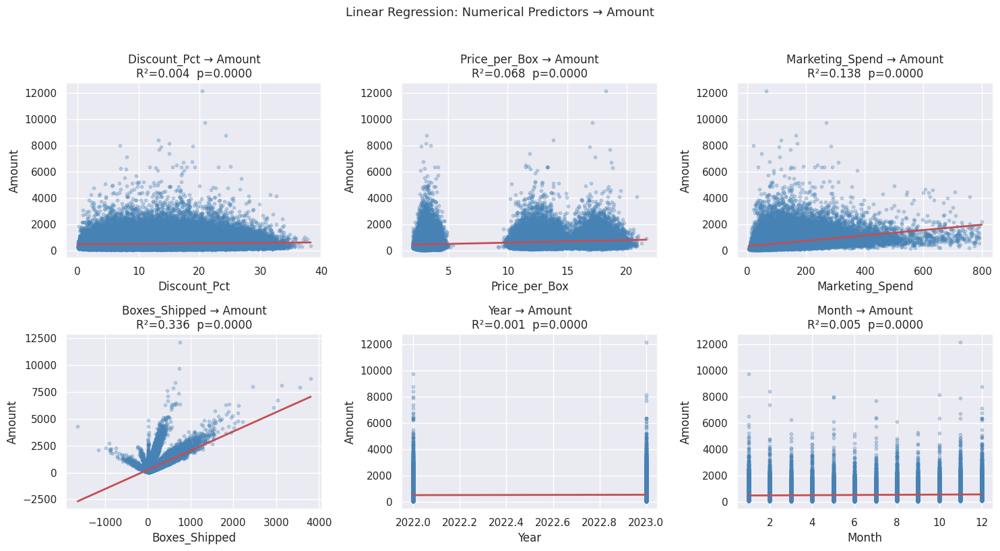


── Cohen's d Effect Size ──
  Product (70% Dark Bar vs Truffle Gift Box):  d=-0.633 (medium)  t-test p=0.0000  MWU p=0.0000
  Country (Australia vs Brazil):  d=-0.601 (medium)  t-test p=0.0000  MWU p=0.0000
  Channel (Retail vs Wholesale):  d=-0.449 (small)  t-test p=0.0000  MWU p=0.0000
  Weekday (Sunday vs Saturday):  d=0.009 (small)  t-test p=0.2757  MWU p=0.7546

  Pareto (Product): Top 6 (50.0%) drive 80% of revenue


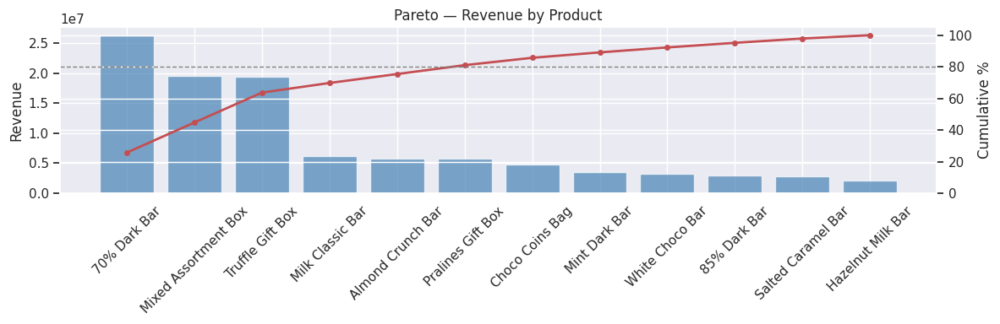


  Pareto (Country): Top 3 (60.0%) drive 80% of revenue


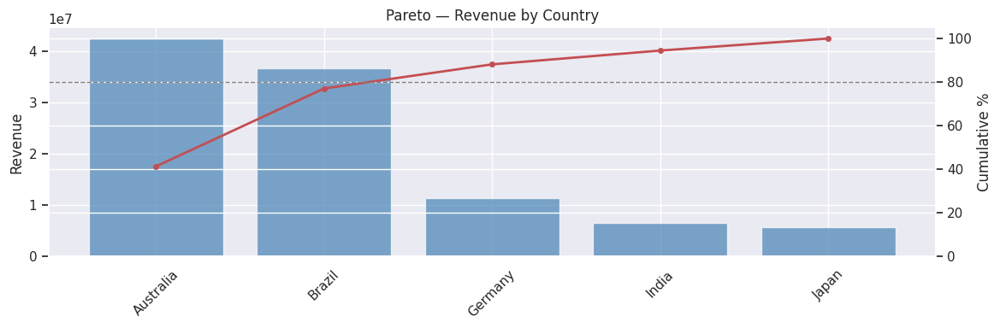


  Pareto (Channel): Top 2 (66.7%) drive 80% of revenue


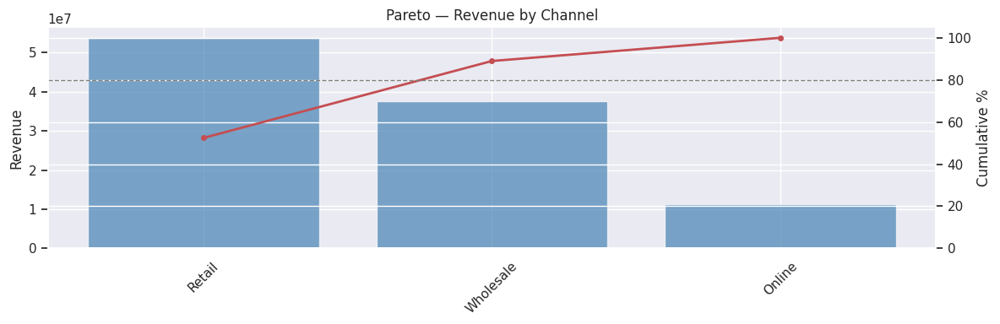


  Pareto (Weekday): Top 6 (85.7%) drive 80% of revenue


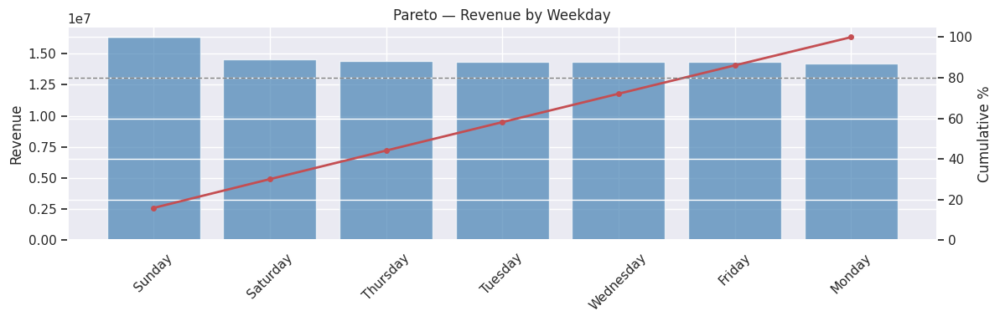


── Discount Groups vs Amount: F=340.944, p=0.000000 ──
                  mean  median  count
Discount_Group                       
None            311.75  311.75      1
Low             487.27  396.90  69854
Medium          519.67  423.04  99727
High            549.31  449.04  30418


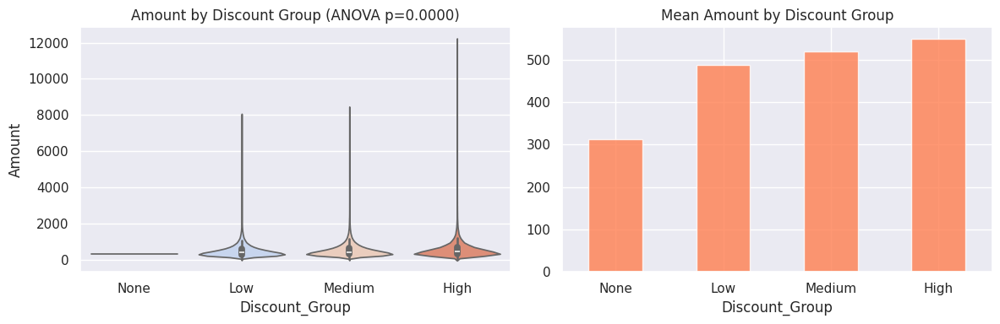


Monthly series: 24 points  (2022-01 → 2023-12)

── Stationarity Tests ──
  ADF  : stat=-0.2405, p=0.9335  → Non-stationary ✗
  KPSS : stat=0.3315, p=0.1000  → Stationary ✓


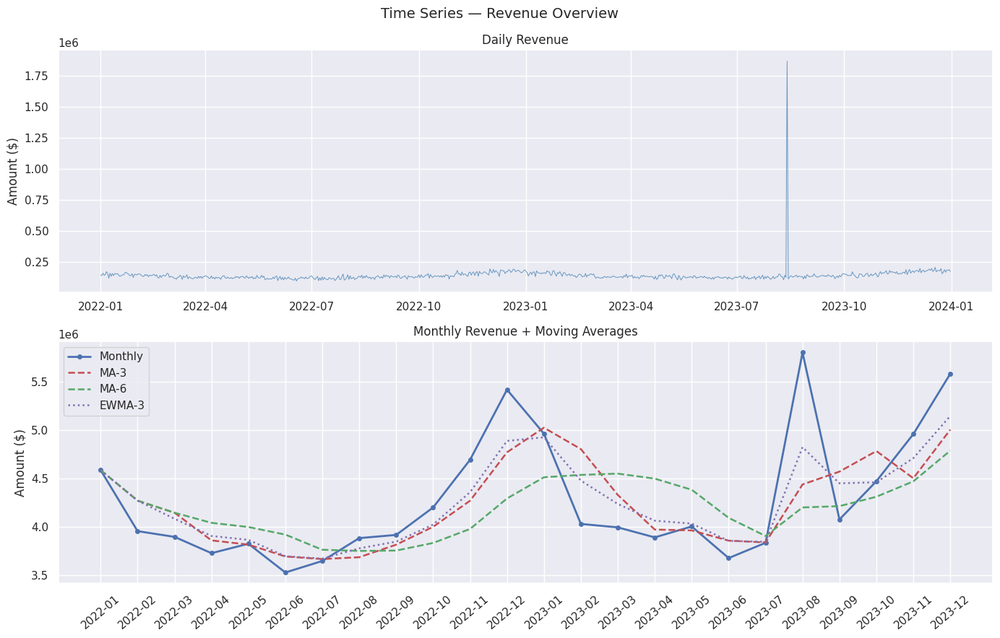

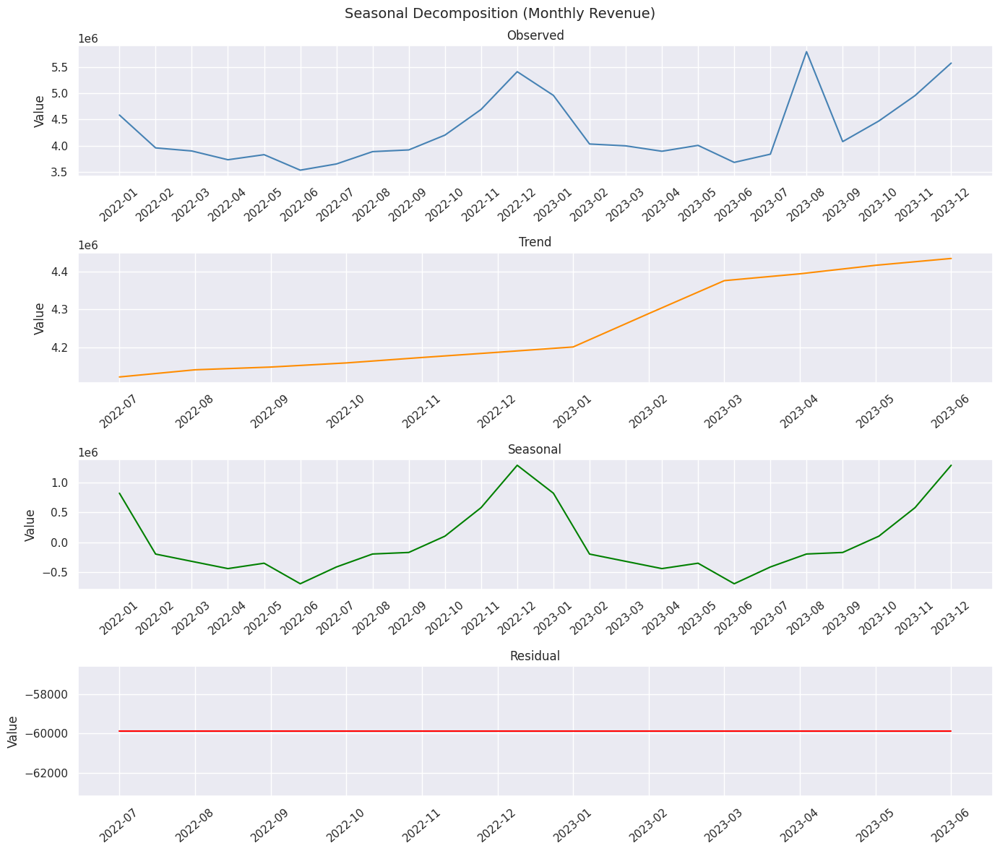

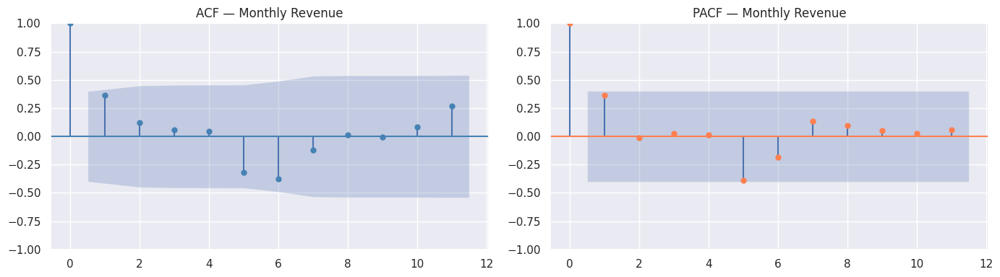

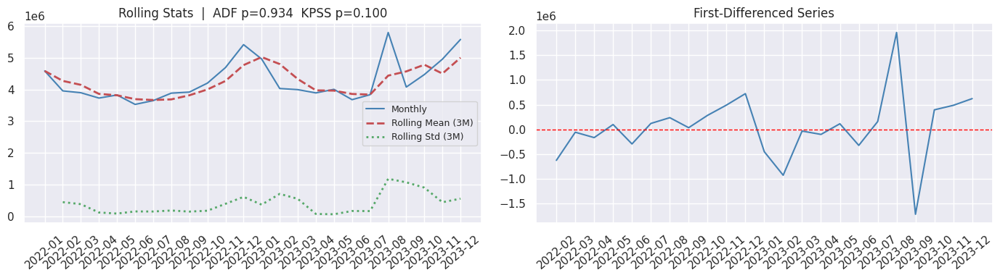

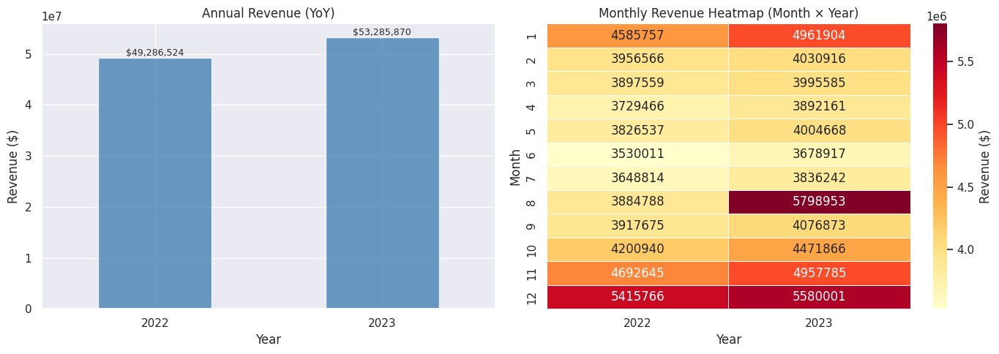

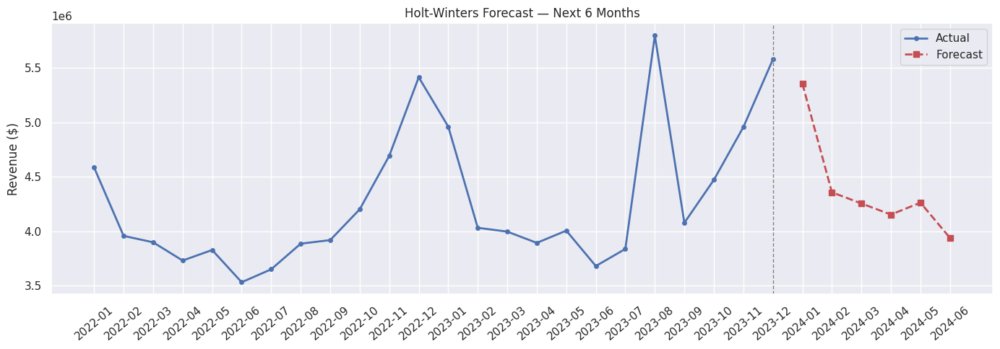


── Forecast Values ──
  2024-01: $5,356,276
  2024-02: $4,357,216
  2024-03: $4,254,798
  2024-04: $4,152,659
  2024-05: $4,262,069
  2024-06: $3,937,699


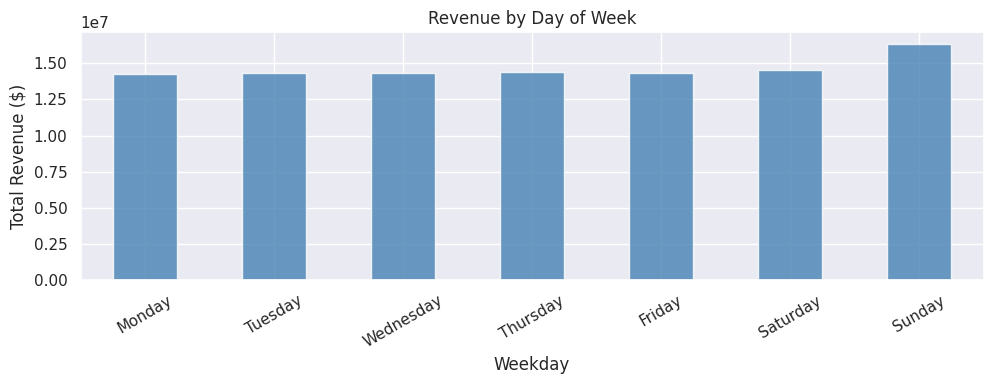

In [9]:

# ── 8. Linear Regression: each numerical → Amount ───────────────
print("\n── Linear Regression: Predictors → Amount ──")
target = 'Amount'
# Filter out 'Amount' from numerical_cols if it is present
predictors = [c for c in numerical_cols if c != target]

if len(predictors) > 0:
    # Adjust figsize dynamically based on the number of plots
    num_cols_reg_plot = 3
    num_rows_reg_plot = math.ceil(len(predictors) / num_cols_reg_plot)
    fig, axes = plt.subplots(num_rows_reg_plot, num_cols_reg_plot,
                             figsize=(5 * num_cols_reg_plot, 4 * num_rows_reg_plot))
    # Ensure axes is always a 1D array for easier iteration
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    i = 0
    for col in predictors:
        # Ensure data is numeric and handle NaNs
        x = df[col].dropna().values
        y = df[target].loc[df[col].dropna().index].dropna().values # Align y with x after dropping NaNs

        if len(x) > 1 and len(y) > 1: # linregress requires at least 2 data points
            slope, intercept, r, p_r, se = stats.linregress(x, y)
            print(f"  {col:20s}  slope={slope:.4f}  R²={r**2:.4f}  p={p_r:.6f}")
            x_line = np.linspace(x.min(), x.max(), 200)
            axes[i].scatter(x, y, alpha=0.3, s=10, color='steelblue')
            axes[i].plot(x_line, slope * x_line + intercept, 'r-', linewidth=2)
            axes[i].set_title(f'{col} → Amount\nR²={r**2:.3f}  p={p_r:.4f}')
            axes[i].set_xlabel(col); axes[i].set_ylabel('Amount')
            i += 1
        else:
            print(f"  {col:20s}: Not enough valid data points for Linear Regression.")

    # Hiding any unused subplots
    for j in range(i, len(axes)):
        axes[j].axis('off')

    plt.suptitle('Linear Regression: Numerical Predictors → Amount', y=1.02, fontsize=13)
    plt.tight_layout()
    plt.show()
else:
    print(f"No numerical predictor columns found (excluding '{target}').")

# ── 9. Effecting Size (Cohen's d) between top-2 groups per category
print("\n── Cohen's d Effect Size ──")
for cat in categorical_cols:
    top2 = df[cat].value_counts().head(2).index.tolist()
    if len(top2) < 2:
        print(f"  {cat}: Less than two unique values for Cohen's d calculation.")
        continue

    # Ensuring 'Amount' is numeric
    g1 = df[df[cat] == top2[0]]['Amount'].dropna().astype(float)
    g2 = df[df[cat] == top2[1]]['Amount'].dropna().astype(float)

    if len(g1) > 1 and len(g2) > 1: # ttest_ind requires at least 2 data points per group
        t, p_t = ttest_ind(g1, g2, equal_var=False)
        u, p_u = mannwhitneyu(g1, g2, alternative='two-sided')

        # Checking if std is zero to avoid division by zero in pooled std dev
        pooled_std_g1 = g1.std() if g1.std() != 0 else 1e-9 # small epsilon to prevent div by zero
        pooled_std_g2 = g2.std() if g2.std() != 0 else 1e-9

        pooled = np.sqrt((pooled_std_g1**2 + pooled_std_g2**2) / 2)

        if pooled > 0: # Avoiding division by zero for Cohen's d
            d = (g1.mean() - g2.mean()) / pooled
            size = 'large' if abs(d) > 0.8 else 'medium' if abs(d) > 0.5 else 'small'
            print(f"  {cat} ({top2[0]} vs {top2[1]}):  d={d:.3f} ({size})  t-test p={p_t:.4f}  MWU p={p_u:.4f}")
        else:
            print(f"  {cat} ({top2[0]} vs {top2[1]}): Pooled standard deviation is zero, Cohen's d cannot be calculated.")
    else:
        print(f"  {cat} ({top2[0]} vs {top2[1]}): Not enough data in one or both groups for Cohen's d, t-test, or MWU test.")

# ── 10. Pareto / 80-20 Analysis ────────────────────────────────
for cat in categorical_cols:
    # Ensuring 'Amount' is numeric for revenue calculation
    rev = df.groupby(cat)['Amount'].sum().sort_values(ascending=False)

    if rev.sum() > 0: # Avoiding division by zero if total revenue is 0
        cumsum_pct = rev.cumsum() / rev.sum() * 100
        n80 = (cumsum_pct <= 80).sum() + 1
        pct_of_total = n80 / len(rev) * 100
        print(f"\n  Pareto ({cat}): Top {n80} ({pct_of_total:.1f}%) drive 80% of revenue")

        fig, ax1 = plt.subplots(figsize=(12, 4))
        ax2 = ax1.twinx()
        ax1.bar(rev.index, rev.values, color='steelblue', alpha=0.7)
        ax2.plot(rev.index, cumsum_pct.values, 'ro-', linewidth=2, markersize=4)
        ax2.axhline(80, color='gray', linestyle='--', linewidth=1)
        ax1.set_ylabel('Revenue'); ax2.set_ylabel('Cumulative %'); ax2.set_ylim(0, 105)
        ax1.set_title(f'Pareto — Revenue by {cat}')
        ax1.tick_params(axis='x', rotation=45)
        plt.tight_layout(); plt.show()
    else:
        print(f"\n  Pareto ({cat}): Total revenue is zero, skipping analysis.")

# ── 11. Discount impact (if column exists) ─────────────────────
if 'Discount_Pct' in df.columns:
    # Ensure 'Amount' is numeric for group calculations
    df['Discount_Group'] = pd.cut(df['Discount_Pct'], bins=[-1, 0, 10, 20, 100],
                                   labels=['None', 'Low', 'Medium', 'High'])
    # Get groups with sufficient data after ensuring Amount is float
    disc_groups = [g['Amount'].dropna().astype(float) for _, g in df.groupby('Discount_Group') if len(g['Amount'].dropna()) > 1]

    if len(disc_groups) >= 2:
        f_d, p_d = f_oneway(*disc_groups)
        print(f"\n── Discount Groups vs Amount: F={f_d:.3f}, p={p_d:.6f} ──")
        # Ensuring 'Amount' is float for aggregation as well
        print(df.groupby('Discount_Group')['Amount'].agg(['mean','median','count']).round(2).to_string())

        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        sns.violinplot(data=df, x='Discount_Group', y='Amount', ax=axes[0],
                       palette='coolwarm', hue='Discount_Group', legend=False)
        axes[0].set_title(f'Amount by Discount Group (ANOVA p={p_d:.4f})')
        df.groupby('Discount_Group')['Amount'].mean().plot(kind='bar', ax=axes[1], color='coral', alpha=0.8)
        axes[1].set_title('Mean Amount by Discount Group')
        axes[1].tick_params(axis='x', rotation=0)
        plt.tight_layout(); plt.show()
    else:
        print(f"\n── Discount Groups vs Amount: Not enough groups with sufficient data for ANOVA. ──")


# TIME SERIES ANALYSIS

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

df['Order_Date'] = pd.to_datetime(df['Order_Date'])
df.sort_values('Order_Date', inplace=True)

# Ensure 'Amount' is numeric before resampling
daily   = df.set_index('Order_Date')['Amount'].astype(float).resample('D').sum().fillna(0)
monthly = df.set_index('Order_Date')['Amount'].astype(float).resample('ME').sum()
monthly.index = monthly.index.to_period('M')
monthly_vals  = monthly.values

print(f"\nMonthly series: {len(monthly)} points  ({monthly.index[0]} → {monthly.index[-1]})")

# ── 12. Stationarity ────────────────────────────────────────────
# Ensuring monthly_vals has enough data points for ADF/KPSS
if len(monthly_vals) > 5: # ADF/KPSS need a minimum number of observations
    adf_stat, adf_p, _, _, adf_cv, _ = adfuller(monthly_vals, autolag='AIC')
    kpss_stat, kpss_p, _, _          = kpss(monthly_vals, regression='c', nlags='auto')
    print(f"\n── Stationarity Tests ──")
    print(f"  ADF  : stat={adf_stat:.4f}, p={adf_p:.4f}  → {'Stationary ✓' if adf_p < 0.05 else 'Non-stationary ✗'}")
    print(f"  KPSS : stat={kpss_stat:.4f}, p={kpss_p:.4f}  → {'Non-stationary ✗' if kpss_p < 0.05 else 'Stationary ✓'}")
else:
    print(f"\n── Stationarity Tests ──")
    print("Not enough data points for ADF/KPSS tests.")

# ── 13. Revenue over time + MA ──────────────────────────────────
# Ensuring there is enough monthly data to plot
if len(monthly) > 0:
    ma3  = monthly.rolling(3, min_periods=1).mean()
    ma6  = monthly.rolling(6, min_periods=1).mean()
    ewma = monthly.ewm(span=3, adjust=False).mean()
    x_str = [str(p) for p in monthly.index]

    fig, axes = plt.subplots(2, 1, figsize=(14, 9))
    axes[0].plot(daily.index, daily.values, color='steelblue', linewidth=0.7, alpha=0.8)
    axes[0].set_title('Daily Revenue'); axes[0].set_ylabel('Amount ($)')

    axes[1].plot(x_str, monthly.values, 'bo-', linewidth=2, markersize=4, label='Monthly')
    axes[1].plot(x_str, ma3.values, 'r--', linewidth=1.8, label='MA-3')
    axes[1].plot(x_str, ma6.values, 'g--', linewidth=1.8, label='MA-6')
    axes[1].plot(x_str, ewma.values, 'm:', linewidth=1.8, label='EWMA-3')
    axes[1].set_title('Monthly Revenue + Moving Averages')
    axes[1].set_ylabel('Amount ($)'); axes[1].legend()
    axes[1].tick_params(axis='x', rotation=40)

    plt.suptitle('Time Series — Revenue Overview', fontsize=14)
    plt.tight_layout(); plt.show()
else:
    print("Not enough monthly data for Revenue over time + MA plot.")

# ── 14. Seasonal Decomposition ──────────────────────────────────
# Seasonal decomposition requires at least 2 periods for the given frequency
if len(monthly_vals) >= 2 * 12: # For seasonal_periods=12
    period = 12
    decomp = seasonal_decompose(monthly_vals, model='additive', period=period)

    fig, axes = plt.subplots(4, 1, figsize=(14, 12))
    labels = ['Observed', 'Trend', 'Seasonal', 'Residual']
    comps  = [decomp.observed, decomp.trend, decomp.seasonal, decomp.resid]
    colors = ['steelblue', 'darkorange', 'green', 'red']
    for ax, label, comp, col in zip(axes, labels, comps, colors):
        ax.plot(x_str, comp, color=col, linewidth=1.5)
        ax.set_title(label); ax.set_ylabel('Value')
        ax.tick_params(axis='x', rotation=40)
    plt.suptitle('Seasonal Decomposition (Monthly Revenue)', fontsize=14)
    plt.tight_layout(); plt.show()
elif len(monthly_vals) >= 2:
    # If not enough for 12-month seasonality, try a smaller period if possible
    period = max(2, len(monthly_vals) // 2)
    decomp = seasonal_decompose(monthly_vals, model='additive', period=period)

    fig, axes = plt.subplots(4, 1, figsize=(14, 12))
    labels = ['Observed', 'Trend', 'Seasonal', 'Residual']
    comps  = [decomp.observed, decomp.trend, decomp.seasonal, decomp.resid]
    colors = ['steelblue', 'darkorange', 'green', 'red']
    for ax, label, comp, col in zip(axes, labels, comps, colors):
        ax.plot(x_str, comp, color=col, linewidth=1.5)
        ax.set_title(label); ax.set_ylabel('Value')
        ax.tick_params(axis='x', rotation=40)
    plt.suptitle(f'Seasonal Decomposition (Monthly Revenue, period={period})', fontsize=14)
    plt.tight_layout(); plt.show()
else:
    print("Not enough monthly data for Seasonal Decomposition.")

# ── 15. ACF / PACF ─────────────────────────────────────────────
if len(monthly_vals) > 1: # ACF/PACF require more than 1 data point
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(monthly_vals,  lags=min(20, len(monthly)//2 - 1), ax=axes[0], color='steelblue')
    plot_pacf(monthly_vals, lags=min(20, len(monthly)//2 - 1), ax=axes[1], color='coral', method='ywm')
    axes[0].set_title('ACF — Monthly Revenue')
    axes[1].set_title('PACF — Monthly Revenue')
    plt.tight_layout(); plt.show()
else:
    print("Not enough monthly data for ACF / PACF plots.")

# ── 16. Rolling stats + first-difference ───────────────────────
if len(monthly) > 1:
    roll_mean = monthly.rolling(3, min_periods=1).mean()
    roll_std  = monthly.rolling(3, min_periods=1).std()

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    axes[0].plot(x_str, monthly.values, color='steelblue', linewidth=1.5, label='Monthly')
    axes[0].plot(x_str, roll_mean.values, 'r--', linewidth=2, label='Rolling Mean (3M)')
    axes[0].plot(x_str, roll_std.values,  'g:', linewidth=2,  label='Rolling Std (3M)')
    # Ensure adf_p and kpss_p are defined before printing them
    adf_p_str = f'{adf_p:.3f}' if 'adf_p' in locals() and adf_p is not None else 'N/A'
    kpss_p_str = f'{kpss_p:.3f}' if 'kpss_p' in locals() and kpss_p is not None else 'N/A'
    axes[0].set_title(f'Rolling Stats  |  ADF p={adf_p_str}  KPSS p={kpss_p_str}')
    axes[0].legend(fontsize=9); axes[0].tick_params(axis='x', rotation=40)

    if len(monthly_vals) > 1:
        diff1 = np.diff(monthly_vals)
        axes[1].plot([str(p) for p in monthly.index[1:]], diff1, color='steelblue', linewidth=1.5)
        axes[1].axhline(0, color='red', linestyle='--', linewidth=1)
        axes[1].set_title('First-Differenced Series')
        axes[1].tick_params(axis='x', rotation=40)
    else:
        axes[1].set_title('First-Differenced Series (Not enough data)')
        axes[1].axis('off')
    plt.tight_layout(); plt.show()
else:
    print("Not enough monthly data for Rolling stats + first-difference plot.")

# ── 17. YoY + Monthly Heatmap ──────────────────────────────────
df['Year']  = df['Order_Date'].dt.year
df['Month'] = df['Order_Date'].dt.month

yoy = df.groupby('Year')['Amount'].sum()
monthly_pivot = df.groupby(['Year','Month'])['Amount'].sum().unstack(level=0)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
yoy.plot(kind='bar', ax=axes[0], color='steelblue', alpha=0.8)
for bar in axes[0].patches:
    axes[0].annotate(f"${bar.get_height():,.0f}",
                     (bar.get_x() + bar.get_width()/2, bar.get_height()),
                     ha='center', va='bottom', fontsize=9)
axes[0].set_title('Annual Revenue (YoY)'); axes[0].set_ylabel('Revenue ($)')
axes[0].tick_params(axis='x', rotation=0)

sns.heatmap(monthly_pivot, annot=True, fmt='.0f', cmap='YlOrRd',
            ax=axes[1], linewidths=0.4, cbar_kws={'label': 'Revenue ($)'})
axes[1].set_title('Monthly Revenue Heatmap (Month × Year)')
axes[1].set_xlabel('Year'); axes[1].set_ylabel('Month')
plt.tight_layout(); plt.show()

# ── 18. Holt-Winters Forecast ───────────────────────────────────
# Holt-Winters requires enough data points; typically at least 2 full seasonal cycles for good performance
# If seasonal_periods=12, then len(monthly_vals) >= 24 is ideal.
# For non-seasonal, len(monthly_vals) > 1 is needed for trend.
if len(monthly_vals) > 1: # Basic check for minimum data
    n_forecast  = 6
    seasonal_periods_val = 12 if len(monthly_vals) >= 24 else None
    trend_val = 'add' if len(monthly_vals) > 1 else None # Trend needs at least 2 points
    seasonal_val = 'add' if seasonal_periods_val is not None else None

    if trend_val or seasonal_val: # Checking if a model can be fit
        hw_model    = ExponentialSmoothing(
            monthly_vals, trend=trend_val,
            seasonal=seasonal_val,
            seasonal_periods=seasonal_periods_val
        ).fit(optimized=True)
        hw_forecast = hw_model.forecast(n_forecast)
        fore_idx    = pd.period_range(start=monthly.index[-1] + 1, periods=n_forecast, freq='M')

        fig, ax = plt.subplots(figsize=(14, 5))
        ax.plot(x_str, monthly.values, 'bo-', linewidth=2, markersize=4, label='Actual')
        ax.plot([str(p) for p in fore_idx], hw_forecast, 'r--s', linewidth=2, markersize=6, label='Forecast')
        ax.axvline(x=x_str[-1], color='gray', linestyle='--', linewidth=1)
        ax.set_title(f'Holt-Winters Forecast — Next {n_forecast} Months')
        ax.set_ylabel('Revenue ($)'); ax.legend()
        ax.tick_params(axis='x', rotation=40)
        plt.tight_layout(); plt.show()

        print("\n── Forecast Values ──")
        for p, v in zip(fore_idx, hw_forecast):
            print(f"  {p}: ${v:,.0f}")
    else:
        print("Not enough monthly data to fit a Holt-Winters model (need at least 2 data points for trend or seasonality).")
else:
    print("Not enough monthly data for Holt-Winters Forecast.")

# ── 19. Weekday pattern ─────────────────────────────────────────
df['Weekday'] = df['Order_Date'].dt.day_name()
weekday_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
# Reindex to ensure all weekdays are present, even if some have zero revenue
weekday_rev   = df.groupby('Weekday')['Amount'].sum().reindex(
    [w for w in weekday_order if w in df['Weekday'].unique()]) # Only reindex to unique weekdays present in data

if not weekday_rev.empty:
    fig, ax = plt.subplots(figsize=(10, 4))
    weekday_rev.plot(kind='bar', ax=ax, color='steelblue', alpha=0.8)
    ax.set_title('Revenue by Day of Week'); ax.set_ylabel('Total Revenue ($)')
    ax.tick_params(axis='x', rotation=30)
    plt.tight_layout(); plt.show()
else:
    print("No data to analyze weekday revenue patterns.")

# Feature Engineering

✓ FE1: Date/time features (Year, Month, Quarter, Season, Weekend…)
✓ FE2: Ratio features (ROI, Effective Price, Revenue per Marketing…)
✓ FE3: Aggregate features (Salesperson/Country/Product stats)
✓ FE4: Binning (Amount tier, Discount band, Marketing tier)
✓ FE5: Log transforms (log_Amount, log_Marketing_Spend…)
✓ FE6: Z-score standardised features
✓ FE7: Min-Max scaled features
✓ FE8: Polynomial features (degree-2): ['Amount^2', 'Amount Marketing_Spend', 'Amount Discount_Pct', 'Marketing_Spend^2', 'Marketing_Spend Discount_Pct', 'Discount_Pct^2']
✓ FE9: Label encoded: ['Product', 'Country', 'Channel', 'Salesperson', 'Weekday', 'Season']
✓ FE10: One-hot encoded (low cardinality): ['Country', 'Channel', 'Season']
✓ FE11: Interaction terms (Mkt×Discount, Mkt×Month, Price×Quarter…)
✓ FE12: Outlier flag (z>2.5): 5099 flagged
✓ FE13: Performance vs group average (Amount vs Salesperson avg, Country avg)
✓ FE14: Percentile rank features

Final dataset: 83 columns  (started with 77 approx)
To

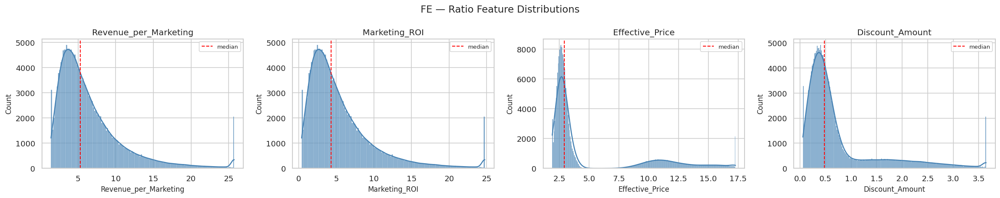

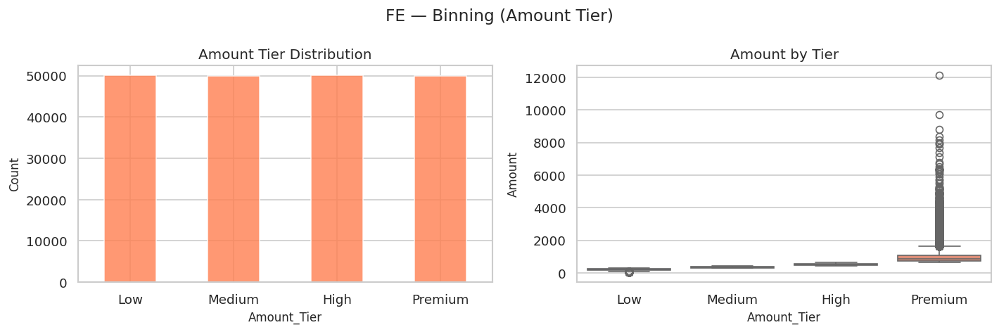

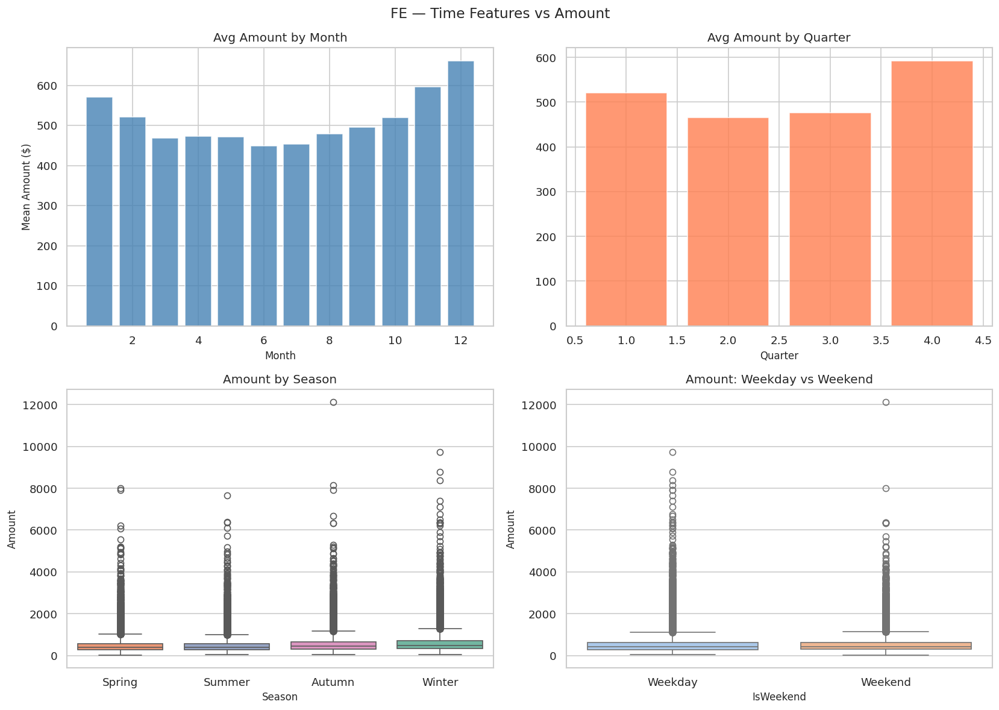

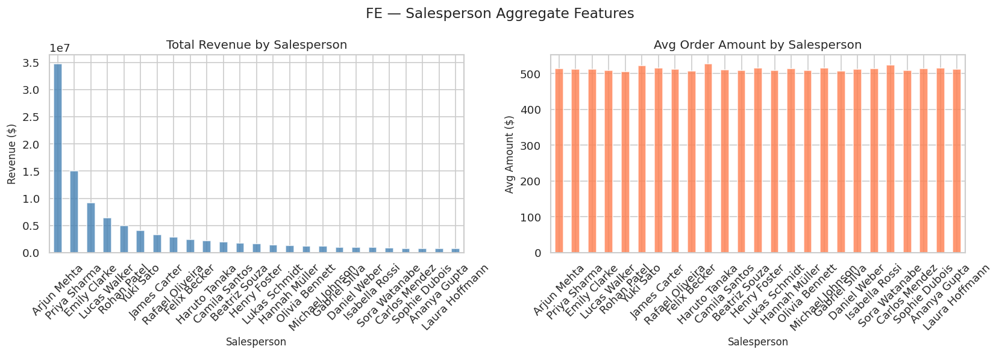

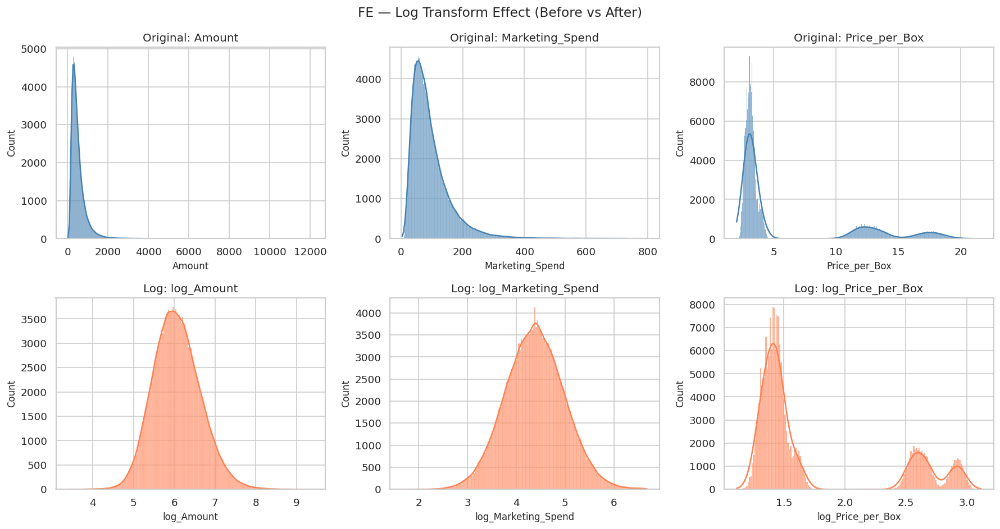

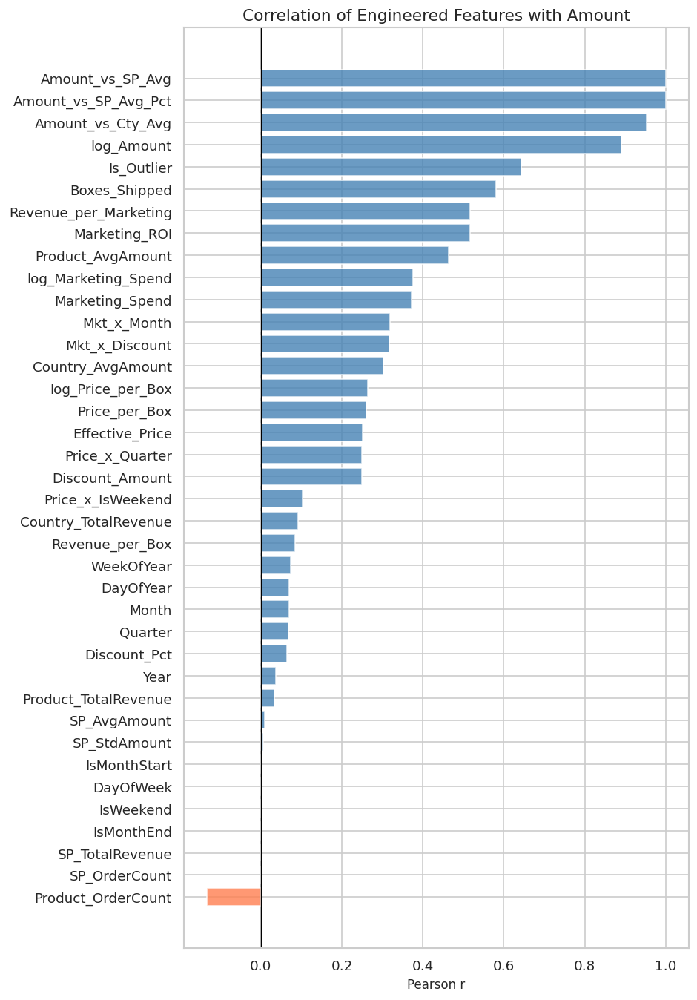

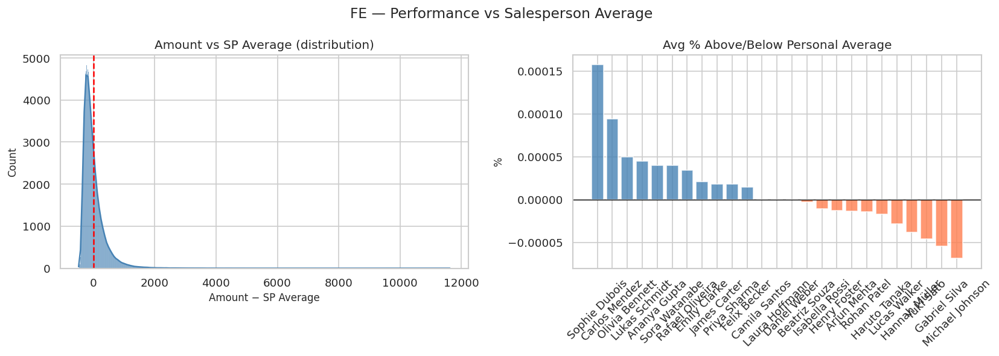

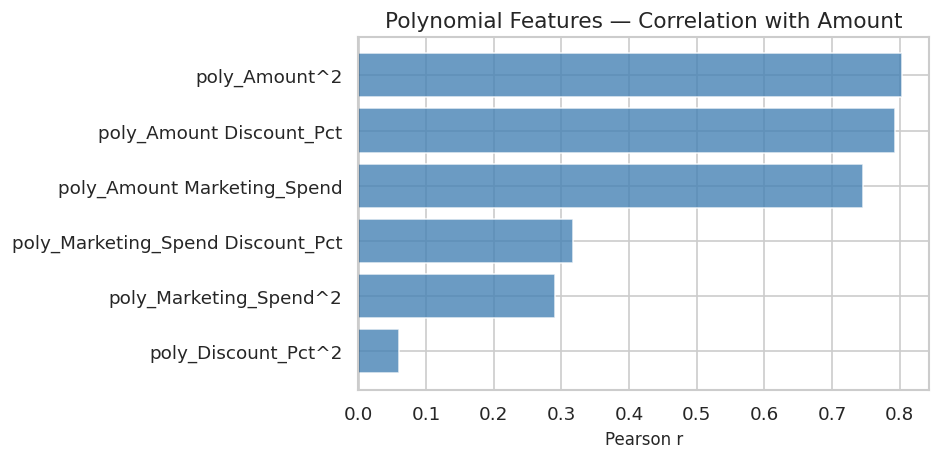

✓ All Feature Engineering visualisations complete.


In [11]:
# ================================================================
# FEATURE ENGINEERING — Chocolate Sales 2022-2023
# Paste after your existing cleaned df
# ================================================================
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, PolynomialFeatures
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

df['Order_Date'] = pd.to_datetime(df['Order_Date'])
df.sort_values('Order_Date', inplace=True)
df.reset_index(drop=True, inplace=True)

# ── FE 1. Date / Time Features ──────────────────────────────────
df['Year']          = df['Order_Date'].dt.year
df['Month']         = df['Order_Date'].dt.month
df['Quarter']       = df['Order_Date'].dt.quarter
df['DayOfWeek']     = df['Order_Date'].dt.dayofweek          # 0=Mon
df['DayOfYear']     = df['Order_Date'].dt.dayofyear
df['WeekOfYear']    = df['Order_Date'].dt.isocalendar().week.astype(int)
df['IsWeekend']     = (df['DayOfWeek'] >= 5).astype(int)
df['IsMonthStart']  = df['Order_Date'].dt.is_month_start.astype(int)
df['IsMonthEnd']    = df['Order_Date'].dt.is_month_end.astype(int)
df['Season']        = df['Month'].map({12:'Winter',1:'Winter',2:'Winter',
                                        3:'Spring',4:'Spring',5:'Spring',
                                        6:'Summer',7:'Summer',8:'Summer',
                                        9:'Autumn',10:'Autumn',11:'Autumn'})
print("✓ FE1: Date/time features (Year, Month, Quarter, Season, Weekend…)")

# ── FE 2. Ratio Features ────────────────────────────────────────
if 'Price_per_Box' in df.columns and 'Marketing_Spend' in df.columns:
    df['Revenue_per_Marketing'] = (df['Amount'] / df['Marketing_Spend'].clip(lower=1)).round(3)
    df['Marketing_ROI']         = ((df['Amount'] - df['Marketing_Spend']) /
                                    df['Marketing_Spend'].clip(lower=1)).round(3)

if 'Price_per_Box' in df.columns and 'Boxes_Shipped' in df.columns:
    df['Revenue_per_Box']       = (df['Amount'] / df['Boxes_Shipped'].clip(lower=1)).round(3)

if 'Discount_Pct' in df.columns:
    df['Effective_Price']       = df['Price_per_Box'] * (1 - df['Discount_Pct'] / 100)
    df['Discount_Amount']       = df['Price_per_Box'] * (df['Discount_Pct'] / 100)
print("✓ FE2: Ratio features (ROI, Effective Price, Revenue per Marketing…)")

# ── FE 3. Aggregate / Rolling Features ──────────────────────────
if 'Salesperson' in df.columns:
    sp_stats = df.groupby('Salesperson')['Amount'].agg(['mean','sum','std','count'])
    sp_stats.columns = ['SP_AvgAmount','SP_TotalRevenue','SP_StdAmount','SP_OrderCount']
    df = df.merge(sp_stats, on='Salesperson', how='left')

if 'Country' in df.columns:
    cty_stats = df.groupby('Country')['Amount'].agg(['mean','sum'])
    cty_stats.columns = ['Country_AvgAmount','Country_TotalRevenue']
    df = df.merge(cty_stats, on='Country', how='left')

if 'Product' in df.columns:
    prod_stats = df.groupby('Product')['Amount'].agg(['mean','sum','count'])
    prod_stats.columns = ['Product_AvgAmount','Product_TotalRevenue','Product_OrderCount']
    df = df.merge(prod_stats, on='Product', how='left')
print("✓ FE3: Aggregate features (Salesperson/Country/Product stats)")

# ── FE 4. Binning / Discretisation ──────────────────────────────
df['Amount_Tier'] = pd.qcut(df['Amount'], q=4,
                             labels=['Low','Medium','High','Premium'], duplicates='drop')

if 'Discount_Pct' in df.columns:
    df['Discount_Band'] = pd.cut(df['Discount_Pct'],
                                  bins=[-1, 0, 10, 20, 100],
                                  labels=['None','Low','Medium','High'])

if 'Marketing_Spend' in df.columns:
    df['Marketing_Tier'] = pd.qcut(df['Marketing_Spend'], q=3,
                                    labels=['Low','Mid','High'], duplicates='drop')
print("✓ FE4: Binning (Amount tier, Discount band, Marketing tier)")

# ── FE 5. Log Transform ─────────────────────────────────────────
for col in ['Amount', 'Marketing_Spend', 'Price_per_Box']:
    if col in df.columns:
        df[f'log_{col}'] = np.log1p(df[col].clip(lower=0))
print("✓ FE5: Log transforms (log_Amount, log_Marketing_Spend…)")

# ── FE 6. Z-score Standardisation ───────────────────────────────
num_cols = df.select_dtypes(include=np.number).columns.tolist()
# Exclude already-engineered aggregates to avoid data leakage
base_num = ['Amount','Marketing_Spend','Price_per_Box','Discount_Pct']
base_num = [c for c in base_num if c in df.columns]
scaler_z = StandardScaler()
z_vals   = scaler_z.fit_transform(df[base_num])
for i, col in enumerate(base_num):
    df[f'z_{col}'] = z_vals[:, i]
print("✓ FE6: Z-score standardised features")

# ── FE 7. Min-Max Scaling ────────────────────────────────────────
scaler_mm = MinMaxScaler()
mm_vals   = scaler_mm.fit_transform(df[base_num])
for i, col in enumerate(base_num):
    df[f'mm_{col}'] = mm_vals[:, i]
print("✓ FE7: Min-Max scaled features")

# ── FE 8. Polynomial Features (key numericals) ──────────────────
poly_input = [c for c in ['Amount','Marketing_Spend','Discount_Pct'] if c in df.columns]
poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
poly_data  = poly.fit_transform(df[poly_input])
poly_names = poly.get_feature_names_out(poly_input)
for i, name in enumerate(poly_names):
    if name not in poly_input:
        df[f'poly_{name}'] = poly_data[:, i]
print(f"✓ FE8: Polynomial features (degree-2): {[n for n in poly_names if n not in poly_input]}")

# ── FE 9. Label Encoding ─────────────────────────────────────────
cat_cols = [c for c in df.select_dtypes('object').columns if df[c].nunique() < 30]
le = LabelEncoder()
for col in cat_cols:
    df[f'le_{col}'] = le.fit_transform(df[col].astype(str))
print(f"✓ FE9: Label encoded: {cat_cols}")

# ── FE 10. One-Hot Encoding ──────────────────────────────────────
low_card = [c for c in cat_cols if df[c].nunique() <= 6]
ohe_df   = pd.get_dummies(df[low_card], prefix=low_card, drop_first=True)
df       = pd.concat([df, ohe_df], axis=1)
print(f"✓ FE10: One-hot encoded (low cardinality): {low_card}")

# ── FE 11. Interaction Terms ─────────────────────────────────────
if 'Marketing_Spend' in df.columns:
    df['Mkt_x_Discount']    = df['Marketing_Spend'] * df.get('Discount_Pct', 0)
    df['Mkt_x_Month']       = df['Marketing_Spend'] * df['Month']
if 'Price_per_Box' in df.columns:
    df['Price_x_Quarter']   = df['Price_per_Box'] * df['Quarter']
    df['Price_x_IsWeekend'] = df['Price_per_Box'] * df['IsWeekend']
print("✓ FE11: Interaction terms (Mkt×Discount, Mkt×Month, Price×Quarter…)")

# ── FE 12. Outlier Flag ───────────────────────────────────────────
z_amount = np.abs(stats.zscore(df['Amount']))
df['Is_Outlier'] = (z_amount > 2.5).astype(int)
print(f"✓ FE12: Outlier flag (z>2.5): {df['Is_Outlier'].sum()} flagged")

# ── FE 13. Revenue Performance vs Group Average ──────────────────
if 'Salesperson' in df.columns:
    df['Amount_vs_SP_Avg']      = df['Amount'] - df['SP_AvgAmount']
    df['Amount_vs_SP_Avg_Pct']  = (df['Amount_vs_SP_Avg'] / df['SP_AvgAmount'].clip(lower=1) * 100).round(2)
if 'Country' in df.columns:
    df['Amount_vs_Cty_Avg']     = df['Amount'] - df['Country_AvgAmount']
print("✓ FE13: Performance vs group average (Amount vs Salesperson avg, Country avg)")

# ── FE 14. Percentile Rank Features ──────────────────────────────
for col in ['Amount', 'Marketing_Spend', 'Price_per_Box']:
    if col in df.columns:
        df[f'rank_{col}'] = df[col].rank(pct=True).round(3)
print("✓ FE14: Percentile rank features")

print(f"\n{'='*50}")
print(f"Final dataset: {df.shape[1]} columns  (started with {len(df.columns) - df.filter(like='poly_').shape[1]} approx)")
print(f"Total rows   : {df.shape[0]}")
print(f"\nNew features summary:")
new_num = df.select_dtypes(include=np.number).columns.tolist()
print(df[new_num].describe().T[['mean','std','min','max']].round(2).to_string())

# FEATURE ENGINEERING — VISUALISATION

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style='whitegrid', palette='muted')
plt.rcParams.update({'figure.dpi': 120, 'axes.titlesize': 12,
                     'axes.labelsize': 10, 'figure.titlesize': 14})

# ── VIZ 1. Engineered Ratio Features Distribution ───────────────
ratio_feats = [c for c in ['Revenue_per_Marketing','Marketing_ROI',
                             'Effective_Price','Discount_Amount'] if c in df.columns]
if ratio_feats:
    fig, axes = plt.subplots(1, len(ratio_feats), figsize=(5*len(ratio_feats), 4))
    if len(ratio_feats) == 1: axes = [axes]
    for ax, col in zip(axes, ratio_feats):
        sns.histplot(df[col].clip(df[col].quantile(0.01), df[col].quantile(0.99)),
                     kde=True, ax=ax, color='steelblue', alpha=0.7)
        ax.axvline(df[col].median(), color='red', linestyle='--', linewidth=1.2, label='median')
        ax.set_title(col); ax.legend(fontsize=8)
    plt.suptitle('FE — Ratio Feature Distributions', fontsize=14)
    plt.tight_layout(); plt.show()

# ── VIZ 2. Amount Tier Distribution ─────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
df['Amount_Tier'].value_counts().sort_index().plot(kind='bar', ax=axes[0],
    color='coral', alpha=0.8)
axes[0].set_title('Amount Tier Distribution')
axes[0].set_ylabel('Count'); axes[0].tick_params(axis='x', rotation=0)

if 'Salesperson' in df.columns:
    sns.boxplot(data=df, x='Amount_Tier', y='Amount', ax=axes[1],
                palette='coolwarm', hue='Amount_Tier', legend=False,
                order=['Low','Medium','High','Premium'])
    axes[1].set_title('Amount by Tier')
plt.suptitle('FE — Binning (Amount Tier)', fontsize=14)
plt.tight_layout(); plt.show()

# ── VIZ 3. Time Features vs Amount ──────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('FE — Time Features vs Amount', fontsize=14)

# Month
month_avg = df.groupby('Month')['Amount'].mean()
axes[0,0].bar(month_avg.index, month_avg.values, color='steelblue', alpha=0.8)
axes[0,0].set_title('Avg Amount by Month'); axes[0,0].set_xlabel('Month')
axes[0,0].set_ylabel('Mean Amount ($)')

# Quarter
quarter_avg = df.groupby('Quarter')['Amount'].mean()
axes[0,1].bar(quarter_avg.index, quarter_avg.values, color='coral', alpha=0.8)
axes[0,1].set_title('Avg Amount by Quarter'); axes[0,1].set_xlabel('Quarter')

# Season
season_order = ['Spring','Summer','Autumn','Winter']
season_order = [s for s in season_order if s in df['Season'].unique()]
sns.boxplot(data=df, x='Season', y='Amount', order=season_order,
            ax=axes[1,0], palette='Set2', hue='Season', legend=False)
axes[1,0].set_title('Amount by Season')

# Weekend vs Weekday
sns.boxplot(data=df, x='IsWeekend', y='Amount', ax=axes[1,1],
            palette='pastel', hue='IsWeekend', legend=False)
axes[1,1].set_xticklabels(['Weekday','Weekend'])
axes[1,1].set_title('Amount: Weekday vs Weekend')

plt.tight_layout(); plt.show()

# ── VIZ 4. Salesperson Aggregate Features ───────────────────────
if 'Salesperson' in df.columns and 'SP_TotalRevenue' in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('FE — Salesperson Aggregate Features', fontsize=14)

    sp_df = df.groupby('Salesperson')[['SP_AvgAmount','SP_TotalRevenue']].first().sort_values(
        'SP_TotalRevenue', ascending=False)
    sp_df['SP_TotalRevenue'].plot(kind='bar', ax=axes[0], color='steelblue', alpha=0.8)
    axes[0].set_title('Total Revenue by Salesperson')
    axes[0].set_ylabel('Revenue ($)'); axes[0].tick_params(axis='x', rotation=45)

    sp_df['SP_AvgAmount'].plot(kind='bar', ax=axes[1], color='coral', alpha=0.8)
    axes[1].set_title('Avg Order Amount by Salesperson')
    axes[1].set_ylabel('Avg Amount ($)'); axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout(); plt.show()

# ── VIZ 5. Log Transform Effect ─────────────────────────────────
log_pairs = [(c, f'log_{c}') for c in ['Amount','Marketing_Spend','Price_per_Box']
             if c in df.columns and f'log_{c}' in df.columns]
if log_pairs:
    fig, axes = plt.subplots(2, len(log_pairs), figsize=(5*len(log_pairs), 8))
    fig.suptitle('FE — Log Transform Effect (Before vs After)', fontsize=14)
    for i, (orig, log_col) in enumerate(log_pairs):
        sns.histplot(df[orig], kde=True, ax=axes[0,i], color='steelblue', alpha=0.65)
        axes[0,i].set_title(f'Original: {orig}')
        sns.histplot(df[log_col], kde=True, ax=axes[1,i], color='coral', alpha=0.65)
        axes[1,i].set_title(f'Log: {log_col}')
    plt.tight_layout(); plt.show()

# ── VIZ 6. Correlation of Engineered Features with Amount ────────
eng_num = [c for c in df.select_dtypes(include='number').columns
           if c != 'Amount' and not c.startswith(('z_','mm_','poly_','rank_','le_'))]
corrs = df[eng_num + ['Amount']].corr()['Amount'].drop('Amount').sort_values()

fig, ax = plt.subplots(figsize=(8, max(6, len(corrs)*0.3)))
colors = ['coral' if v < 0 else 'steelblue' for v in corrs.values]
ax.barh(corrs.index, corrs.values, color=colors, alpha=0.8)
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title('Correlation of Engineered Features with Amount', fontsize=13)
ax.set_xlabel('Pearson r')
plt.tight_layout(); plt.show()

# ── VIZ 7. Performance vs Group Average ─────────────────────────
if 'Amount_vs_SP_Avg' in df.columns and 'Salesperson' in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('FE — Performance vs Salesperson Average', fontsize=14)

    sns.histplot(df['Amount_vs_SP_Avg'], kde=True, ax=axes[0], color='steelblue', alpha=0.7)
    axes[0].axvline(0, color='red', linestyle='--', linewidth=1.5)
    axes[0].set_title('Amount vs SP Average (distribution)')
    axes[0].set_xlabel('Amount − SP Average')

    sp_perf = df.groupby('Salesperson')['Amount_vs_SP_Avg_Pct'].mean().sort_values(ascending=False)
    colors  = ['steelblue' if v >= 0 else 'coral' for v in sp_perf.values]
    axes[1].bar(sp_perf.index, sp_perf.values, color=colors, alpha=0.8)
    axes[1].axhline(0, color='black', linewidth=0.8)
    axes[1].set_title('Avg % Above/Below Personal Average')
    axes[1].set_ylabel('%'); axes[1].tick_params(axis='x', rotation=45)
    plt.tight_layout(); plt.show()

# ── VIZ 8. Polynomial Features Correlation ───────────────────────
poly_cols = [c for c in df.columns if c.startswith('poly_')]
if poly_cols:
    poly_corr = df[poly_cols + ['Amount']].corr()['Amount'].drop('Amount').sort_values()
    fig, ax = plt.subplots(figsize=(8, max(4, len(poly_corr)*0.4)))
    ax.barh(poly_corr.index, poly_corr.values,
            color=['coral' if v < 0 else 'steelblue' for v in poly_corr.values], alpha=0.8)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title('Polynomial Features — Correlation with Amount', fontsize=13)
    ax.set_xlabel('Pearson r')
    plt.tight_layout(); plt.show()

print("✓ All Feature Engineering visualisations complete.")

# Machine Learning

In [ ]:
# Regression (Amount), Classification (Amount Tier), Clustering

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, silhouette_score
)
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import (RandomForestClassifier, RandomForestRegressor,
                               GradientBoostingClassifier, GradientBoostingRegressor)
from sklearn.svm import SVR, SVC
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.inspection import permutation_importance


# ── Feature set ─────────────────────────────────────────────────
base_feats = ['Marketing_Spend', 'Price_per_Box', 'Discount_Pct',
              'Month', 'Quarter', 'DayOfWeek', 'IsWeekend',
              'Year', 'log_Amount'] # Removed 'Season' from here to avoid passing string values to StandardScaler

# Add engineered features if they exist
extra_feats = ['Revenue_per_Marketing', 'Marketing_ROI', 'Effective_Price',
               'Discount_Amount', 'SP_AvgAmount', 'SP_TotalRevenue',
               'Country_AvgAmount', 'Product_AvgAmount',
               'Mkt_x_Discount', 'Mkt_x_Month', 'Price_x_Quarter',
               'Amount_vs_SP_Avg', 'rank_Amount']

# Categorical columns to encode
cat_for_ml = [c for c in ['Salesperson', 'Country', 'Product', 'Category', 'Season']
              if c in df.columns]

# Build working df for ML
df_ml = df.copy()
le    = LabelEncoder()
for col in cat_for_ml:
    df_ml[f'le_{col}'] = le.fit_transform(df_ml[col].astype(str))

# Final feature list
feat_cols = ([c for c in base_feats if c in df_ml.columns and c != 'log_Amount'] +
             [c for c in extra_feats if c in df_ml.columns] +
             [f'le_{c}' for c in cat_for_ml])
feat_cols = list(dict.fromkeys(feat_cols))

print(f"Features used: {len(feat_cols)}")
print(feat_cols)


# A. REGRESSION — Predict Amount

print("\n" + "="*60)
print("A. REGRESSION — Predict Amount")
print("="*60)

X_reg = df_ml[feat_cols].fillna(0)
y_reg = df_ml['Amount']

X_tr_r, X_te_r, y_tr_r, y_te_r = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42)

sc_r     = StandardScaler()
X_tr_rs  = sc_r.fit_transform(X_tr_r)
X_te_rs  = sc_r.transform(X_te_r)

reg_models = {
    'Linear Regression':    LinearRegression(),
    'Ridge':                Ridge(alpha=1.0),
    'Lasso':                Lasso(alpha=0.5),
    'ElasticNet':           ElasticNet(alpha=0.5, l1_ratio=0.5),
    'Decision Tree':        DecisionTreeRegressor(max_depth=6, random_state=42),
    'Random Forest':        RandomForestRegressor(n_estimators=200, random_state=42),
    'Gradient Boosting':    GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVR':                  SVR(kernel='rbf', C=100),
    'KNN Regressor':        KNeighborsRegressor(n_neighbors=5),
}

reg_results = {}
print(f"\n{'Model':22s}  {'R²':>7}  {'MAE':>8}  {'RMSE':>8}  {'CV-R²':>7}")
print("-"*58)
for name, model in reg_models.items():
    model.fit(X_tr_rs, y_tr_r)
    y_pred  = model.predict(X_te_rs)
    r2      = r2_score(y_te_r, y_pred)
    mae     = mean_absolute_error(y_te_r, y_pred)
    rmse    = np.sqrt(mean_squared_error(y_te_r, y_pred))
    cv      = cross_val_score(model, X_tr_rs, y_tr_r, cv=5, scoring='r2').mean()
    reg_results[name] = {'r2': r2, 'mae': mae, 'rmse': rmse, 'cv': cv,
                          'y_pred': y_pred, 'model': model}
    print(f"  {name:20s}  {r2:7.4f}  {mae:8.2f}  {rmse:8.2f}  {cv:7.4f}")

best_reg  = max(reg_results, key=lambda k: reg_results[k]['r2'])
print(f"\n✓ Best model: {best_reg}  (R²={reg_results[best_reg]['r2']:.4f})")

# Feature importance from Random Forest
rf_reg     = reg_models['Random Forest']
feat_imp_r = pd.Series(rf_reg.feature_importances_, index=feat_cols).sort_values(ascending=False)
print(f"\nTop 10 important features:\n{feat_imp_r.head(10).round(4).to_string()}")

# Grid search on best tree model
print("\nGrid search on Gradient Boosting Regressor…")
param_grid_r = {'n_estimators':[100,200], 'max_depth':[3,5], 'learning_rate':[0.05,0.1]}
gs_r = GridSearchCV(GradientBoostingRegressor(random_state=42),
                    param_grid_r, cv=3, scoring='r2', n_jobs=-1)
gs_r.fit(X_tr_rs, y_tr_r)
print(f"Best params: {gs_r.best_params_}  |  Best R²: {gs_r.best_score_:.4f}")


# B. CLASSIFICATION — Predict Amount Tier (Low/Med/High/Premium)

print("\n" + "="*60)
print("B. CLASSIFICATION — Predict Amount Tier")
print("="*60)

# Rebuild Amount_Tier if missing
if 'Amount_Tier' not in df_ml.columns:
    df_ml['Amount_Tier'] = pd.qcut(df_ml['Amount'], q=4,
                                    labels=['Low','Medium','High','Premium'],
                                    duplicates='drop')

# Exclude Amount itself and log_Amount from classification features
clf_feats = [c for c in feat_cols if c not in ['log_Amount', 'rank_Amount']]
X_clf     = df_ml[clf_feats].fillna(0)
y_clf     = LabelEncoder().fit_transform(df_ml['Amount_Tier'].astype(str))
class_names = sorted(df_ml['Amount_Tier'].dropna().astype(str).unique())

X_tr_c, X_te_c, y_tr_c, y_te_c = train_test_split(
    X_clf, y_clf, test_size=0.2, random_state=42, stratify=y_clf)

sc_c    = StandardScaler()
X_tr_cs = sc_c.fit_transform(X_tr_c)
X_te_cs = sc_c.transform(X_te_c)

clf_models = {
    'Logistic Regression':  LogisticRegression(max_iter=1000, multi_class='multinomial', random_state=42),
    'Decision Tree':        DecisionTreeClassifier(max_depth=6, random_state=42),
    'Random Forest':        RandomForestClassifier(n_estimators=200, random_state=42),
    'Gradient Boosting':    GradientBoostingClassifier(n_estimators=200, random_state=42),
    'SVM':                  SVC(kernel='rbf', probability=True, random_state=42),
    'KNN':                  KNeighborsClassifier(n_neighbors=5),
}

clf_results = {}
print(f"\n{'Model':22s}  {'Accuracy':>9}  {'Macro-F1':>9}  {'CV-Acc':>8}")
print("-"*55)
for name, model in clf_models.items():
    model.fit(X_tr_cs, y_tr_c)
    y_pred   = model.predict(X_te_cs)
    acc      = accuracy_score(y_te_c, y_pred)
    report   = classification_report(y_te_c, y_pred, output_dict=True, zero_division=0)
    f1       = report['macro avg']['f1-score']
    cv       = cross_val_score(model, X_tr_cs, y_tr_c, cv=5, scoring='accuracy').mean()
    clf_results[name] = {'acc': acc, 'f1': f1, 'cv': cv,
                          'y_pred': y_pred, 'model': model}
    print(f"  {name:20s}  {acc:9.4f}  {f1:9.4f}  {cv:8.4f}")

best_clf  = max(clf_results, key=lambda k: clf_results[k]['acc'])
print(f"\n✓ Best model: {best_clf}  (Acc={clf_results[best_clf]['acc']:.4f})")
print(f"\nClassification report ({best_clf}):")
print(classification_report(y_te_c, clf_results[best_clf]['y_pred'],
                            target_names=class_names, zero_division=0))

feat_imp_c = pd.Series(clf_models['Random Forest'].feature_importances_,
                        index=clf_feats).sort_values(ascending=False)


# C. CLUSTERING — Unsupervised Customer / Sales Profiling

print("\n" + "="*60)
print("C. CLUSTERING — Sales Profile Segmentation")
print("="*60)

cluster_feats = [c for c in ['Amount','Marketing_Spend','Price_per_Box',
                               'Discount_Pct','Month','IsWeekend'] if c in df_ml.columns]
X_clust  = StandardScaler().fit_transform(df_ml[cluster_feats].fillna(0))

inertias, sil_scores = [], []
K_range = range(2, 9)
for k in K_range:
    km     = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_clust)
    inertias.append(km.inertia_)
    sil_scores.append(silhouette_score(X_clust, labels))

best_k  = list(K_range)[np.argmax(sil_scores)]
print(f"Optimal k = {best_k}  (silhouette = {max(sil_scores):.4f})")

km_best             = KMeans(n_clusters=best_k, random_state=42, n_init=10)
df_ml['Cluster']    = km_best.fit_predict(X_clust)

cluster_profile = df_ml.groupby('Cluster')[cluster_feats + ['Amount']].mean().round(2)
print("\nCluster profiles:\n", cluster_profile.to_string())

# PCA for cluster visualisation
pca2     = PCA(n_components=2)
pca_emb  = pca2.fit_transform(X_clust)
df_ml['PC1'] = pca_emb[:, 0]
df_ml['PC2'] = pca_emb[:, 1]


# ── Summary ──────────────────────────────────────────────────────
print("\n" + "="*60)
print("ML SUMMARY")
print("="*60)
print(f"""
Regression (Predict Amount):
  Best model : {best_reg}
  R²         : {reg_results[best_reg]['r2']:.4f}
  MAE        : {reg_results[best_reg]['mae']:.2f}
  RMSE       : {reg_results[best_reg]['rmse']:.2f}
  Top feature: {feat_imp_r.index[0]}

Classification (Predict Amount Tier):
  Best model : {best_clf}
  Accuracy   : {clf_results[best_clf]['acc']:.4f}
  Macro-F1   : {clf_results[best_clf]['f1']:.4f}
  Top feature: {feat_imp_c.index[0]}

Clustering:
  Optimal k  : {best_k}
  Silhouette : {max(sil_scores):.4f}
""")

# MACHINE LEARNING — VISUALISATION

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.tree import plot_tree
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style='whitegrid', palette='muted')
plt.rcParams.update({'figure.dpi': 120, 'axes.titlesize': 12,
                     'axes.labelsize': 10, 'figure.titlesize': 14})

COLORS = ['#378ADD','#D85A30','#1D9E75','#534AB7','#EF9F27','#D4537E','#639922','#888580']

# A. REGRESSION VISUALISATIONS

# ── VIZ A1: Model comparison ────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('A. Regression — Model Comparison', fontsize=14)

names = list(reg_results.keys())
r2s   = [reg_results[n]['r2']   for n in names]
maes  = [reg_results[n]['mae']  for n in names]
rmses = [reg_results[n]['rmse'] for n in names]
cvs   = [reg_results[n]['cv']   for n in names]

x = np.arange(len(names))
axes[0].barh(names, r2s, color=COLORS[:len(names)], alpha=0.85)
axes[0].axvline(0, color='black', linewidth=0.8)
axes[0].set_title('R² Score'); axes[0].set_xlabel('R²')

axes[1].bar(x - 0.2, maes,  0.35, label='MAE',  color='steelblue', alpha=0.8)
axes[1].bar(x + 0.2, rmses, 0.35, label='RMSE', color='coral',     alpha=0.8)
axes[1].set_xticks(x); axes[1].set_xticklabels(names, rotation=35, ha='right', fontsize=8)
axes[1].set_title('MAE vs RMSE'); axes[1].legend()

axes[2].barh(names, cvs, color=COLORS[:len(names)], alpha=0.85)
axes[2].set_title('5-Fold CV R²'); axes[2].set_xlabel('CV R²')

plt.tight_layout(); plt.show()

# ── VIZ A2: Best model — predicted vs actual + residuals ────────
bp = reg_results[best_reg]
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle(f'A. Regression — {best_reg} Deep Dive', fontsize=14)

# Predicted vs Actual
mn, mx = y_te_r.min(), y_te_r.max()
axes[0].scatter(y_te_r, bp['y_pred'], alpha=0.35, s=15, color='steelblue')
axes[0].plot([mn, mx], [mn, mx], 'r--', linewidth=1.5, label='Perfect fit')
axes[0].set_xlabel('Actual Amount'); axes[0].set_ylabel('Predicted Amount')
axes[0].set_title(f'Predicted vs Actual\nR²={bp["r2"]:.4f}')
axes[0].legend(fontsize=8)

# Residuals vs Predicted
residuals = y_te_r.values - bp['y_pred']
axes[1].scatter(bp['y_pred'], residuals, alpha=0.35, s=15, color='coral')
axes[1].axhline(0, color='black', linewidth=1)
axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('Residual')
axes[1].set_title('Residual Plot')

# Residual distribution
sns.histplot(residuals, kde=True, ax=axes[2], color='coral', alpha=0.7)
axes[2].axvline(0, color='black', linestyle='--', linewidth=1)
axes[2].set_title('Residual Distribution')

plt.tight_layout(); plt.show()

# ── VIZ A3: Feature importance (RF) ─────────────────────────────
fig, ax = plt.subplots(figsize=(10, 6))
feat_imp_r.head(15).plot(kind='barh', ax=ax, color='steelblue', alpha=0.85)
ax.invert_yaxis()
ax.set_title('A. Regression — Top 15 Feature Importances (Random Forest)', fontsize=13)
ax.set_xlabel('Importance')
plt.tight_layout(); plt.show()

# ── VIZ A4: Regularisation comparison (Ridge vs Lasso) ───────────
from sklearn.linear_model import Ridge, Lasso
alphas     = np.logspace(-2, 4, 50)
ridge_r2s, lasso_r2s = [], []
for a in alphas:
    rr = Ridge(alpha=a).fit(X_tr_rs, y_tr_r)
    lr = Lasso(alpha=a, max_iter=5000).fit(X_tr_rs, y_tr_r)
    ridge_r2s.append(r2_score(y_te_r, rr.predict(X_te_rs)))
    lasso_r2s.append(r2_score(y_te_r, lr.predict(X_te_rs)))

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.log10(alphas), ridge_r2s, 'b-o', markersize=3, label='Ridge R²')
ax.plot(np.log10(alphas), lasso_r2s, 'r-s', markersize=3, label='Lasso R²')
ax.set_xlabel('log10(α)'); ax.set_ylabel('R²')
ax.set_title('A. Regularisation — Ridge vs Lasso R² over α')
ax.legend()
plt.tight_layout(); plt.show()


# B. CLASSIFICATION VISUALISATIONS

# ── VIZ B1: Model comparison ────────────────────────────════════
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('B. Classification — Model Comparison (Amount Tier)', fontsize=14)

c_names = list(clf_results.keys())
accs    = [clf_results[n]['acc'] for n in c_names]
f1s     = [clf_results[n]['f1']  for n in c_names]
cvs_c   = [clf_results[n]['cv']  for n in c_names]

x = np.arange(len(c_names))
axes[0].bar(x - 0.2, accs, 0.35, label='Accuracy', color='steelblue', alpha=0.8)
axes[0].bar(x + 0.2, f1s,  0.35, label='Macro-F1', color='coral',     alpha=0.8)
axes[0].set_xticks(x); axes[0].set_xticklabels(c_names, rotation=35, ha='right', fontsize=9)
axes[0].set_ylim(0, 1.1); axes[0].set_title('Accuracy & Macro-F1'); axes[0].legend()

axes[1].barh(c_names, cvs_c, color=COLORS[:len(c_names)], alpha=0.85)
axes[1].set_title('5-Fold CV Accuracy'); axes[1].set_xlabel('CV Accuracy')

plt.tight_layout(); plt.show()

# ── VIZ B2: Confusion matrix (best model) ───────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(f'B. Classification — {best_clf} Results', fontsize=14)

cm = confusion_matrix(y_te_c, clf_results[best_clf]['y_pred'])
ConfusionMatrixDisplay(cm, display_labels=class_names).plot(ax=axes[0], colorbar=False)
axes[0].set_title(f'Confusion Matrix ({best_clf})')

# Per-class recall
per_class = cm.diagonal() / cm.sum(axis=1)
axes[1].bar(class_names, per_class, color=COLORS[:len(class_names)], alpha=0.85)
axes[1].axhline(per_class.mean(), color='red', linestyle='--', linewidth=1.5,
                label=f'Mean = {per_class.mean():.2f}')
axes[1].set_title('Per-class Recall'); axes[1].set_ylabel('Recall')
axes[1].legend()

plt.tight_layout(); plt.show()

# ── VIZ B3: Feature importance (RF Classifier) ──────────────────
fig, ax = plt.subplots(figsize=(10, 6))
feat_imp_c.head(15).plot(kind='barh', ax=ax, color='coral', alpha=0.85)
ax.invert_yaxis()
ax.set_title('B. Classification — Top 15 Feature Importances (Random Forest)', fontsize=13)
ax.set_xlabel('Importance')
plt.tight_layout(); plt.show()

# ── VIZ B4: Decision Tree (shallow — interpretable) ─────────────
from sklearn.tree import DecisionTreeClassifier
dt_vis = DecisionTreeClassifier(max_depth=3, random_state=42)
dt_vis.fit(X_tr_cs, y_tr_c)

fig, ax = plt.subplots(figsize=(18, 6))
plot_tree(dt_vis, feature_names=clf_feats, class_names=class_names,
          filled=True, rounded=True, fontsize=7, ax=ax, max_depth=3)
ax.set_title('B. Decision Tree (depth=3) — Interpretable Rules', fontsize=13)
plt.tight_layout(); plt.show()

# ── VIZ B5: Class distribution in predictions ───────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('B. Classification — Actual vs Predicted Class Distribution', fontsize=14)
pd.Series(y_te_c).value_counts().sort_index().plot(
    kind='bar', ax=axes[0], color='steelblue', alpha=0.8)
axes[0].set_xticklabels(class_names, rotation=0)
axes[0].set_title('Actual Class Distribution')

pd.Series(clf_results[best_clf]['y_pred']).value_counts().sort_index().plot(
    kind='bar', ax=axes[1], color='coral', alpha=0.8)
axes[1].set_xticklabels(class_names, rotation=0)
axes[1].set_title('Predicted Class Distribution')

plt.tight_layout(); plt.show()


# C. CLUSTERING VISUALISATIONS

# ── VIZ C1: Elbow + Silhouette ──────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('C. Clustering — Optimal k', fontsize=14)

axes[0].plot(list(K_range), inertias, 'o-', color='steelblue', linewidth=2)
axes[0].set_xlabel('k'); axes[0].set_ylabel('Inertia')
axes[0].set_title('Elbow Plot')

axes[1].plot(list(K_range), sil_scores, 's-', color='coral', linewidth=2)
axes[1].axvline(best_k, color='gray', linestyle='--', linewidth=1.2, label=f'Best k={best_k}')
axes[1].set_xlabel('k'); axes[1].set_ylabel('Silhouette Score')
axes[1].set_title('Silhouette Score'); axes[1].legend()

plt.tight_layout(); plt.show()

# ── VIZ C2: Cluster scatter (PCA space) ────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('C. Clustering — PCA Projection', fontsize=14)

for c in range(best_k):
    mask = df_ml['Cluster'] == c
    axes[0].scatter(df_ml.loc[mask,'PC1'], df_ml.loc[mask,'PC2'],
                    alpha=0.45, s=18, label=f'Cluster {c}', color=COLORS[c])
axes[0].set_title(f'Clusters in PCA Space (k={best_k})')
axes[0].set_xlabel('PC1'); axes[0].set_ylabel('PC2')
axes[0].legend(fontsize=9)

# Colour by Amount
sc = axes[1].scatter(df_ml['PC1'], df_ml['PC2'], c=df_ml['Amount'],
                      cmap='viridis', alpha=0.45, s=18)
plt.colorbar(sc, ax=axes[1], label='Amount ($)')
axes[1].set_title('PCA Space — Coloured by Amount')
axes[1].set_xlabel('PC1'); axes[1].set_ylabel('PC2')

plt.tight_layout(); plt.show()

# ── VIZ C3: Cluster profile heatmap ────────────────────────────
fig, ax = plt.subplots(figsize=(10, max(3, best_k * 0.8)))
sns.heatmap(cluster_profile[cluster_feats], annot=True, fmt='.1f',
            cmap='YlOrRd', ax=ax, linewidths=0.4)
ax.set_title(f'C. Cluster Profile Heatmap (k={best_k})', fontsize=13)
plt.tight_layout(); plt.show()

# ── VIZ C4: Cluster boxplots for Amount ─────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('C. Clustering — Amount by Cluster', fontsize=14)

sns.boxplot(data=df_ml, x='Cluster', y='Amount', ax=axes[0],
            palette=COLORS[:best_k], hue='Cluster', legend=False)
axes[0].set_title('Amount Distribution per Cluster')

cluster_means = df_ml.groupby('Cluster')['Amount'].mean().sort_values(ascending=False)
cluster_means.plot(kind='bar', ax=axes[1], color=COLORS[:best_k], alpha=0.85)
axes[1].set_title('Mean Amount per Cluster')
axes[1].set_ylabel('Mean Amount ($)'); axes[1].tick_params(axis='x', rotation=0)

plt.tight_layout(); plt.show()

# ── VIZ C5: Hierarchical dendrogram (sample) ───────────────────
sample_idx = np.random.choice(len(X_clust), min(100, len(X_clust)), replace=False)
Z_link     = linkage(X_clust[sample_idx], method='ward')

fig, ax = plt.subplots(figsize=(14, 5))
dendrogram(Z_link, ax=ax, no_labels=True, color_threshold=6)
ax.set_title('C. Hierarchical Clustering — Dendrogram (100 sample)', fontsize=13)
ax.set_ylabel('Distance')
plt.tight_layout(); plt.show()

print("✓ All ML visualisations complete.")

Features used: 25
['Marketing_Spend', 'Price_per_Box', 'Discount_Pct', 'Month', 'Quarter', 'DayOfWeek', 'IsWeekend', 'Year', 'Revenue_per_Marketing', 'Marketing_ROI', 'Effective_Price', 'Discount_Amount', 'SP_AvgAmount', 'SP_TotalRevenue', 'Country_AvgAmount', 'Product_AvgAmount', 'Mkt_x_Discount', 'Mkt_x_Month', 'Price_x_Quarter', 'Amount_vs_SP_Avg', 'rank_Amount', 'le_Salesperson', 'le_Country', 'le_Product', 'le_Season']

A. REGRESSION — Predict Amount

Model                        R²       MAE      RMSE    CV-R²
----------------------------------------------------------
  Linear Regression      1.0000      0.00      0.00   1.0000
  Ridge                  1.0000      0.00      0.00   1.0000
  Lasso                  1.0000      0.50      0.71   1.0000
  ElasticNet             0.9497     39.42     82.29   0.9502
  Decision Tree          0.9990      6.81     11.65   0.9978


# Thank You